### 1. Подготовительный этап
Выполнил: Татьяна Шувайникова

Цель этапа: подготовка датасета для обработки и проведения анализа \
Задачи:
1.   Очистка сырых данных от пустых и малоинформативных статистически столбцов-признаков, снижение размерности массива данных.
2.   Проведение частичного перекрёстного анализа в виде определения взаимной корреляции признаков, выявление коррелируемых столбцов (имеющих прямую взаимосвязь), снижение их количества до минимума.



---
Глоссарий с описанием всех полей из представленного датасета и их расшифровка в
приложении к решению \
*Глоссарий с описанием всех полей.docx* .

---



Импорт библиотек

In [ ]:
import pandas as pd
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
import re

Часть 1.
*   Cчитывание набора данных из файла формата .csv в DataFrame
*   Удаление строк-дубликатов

In [ ]:
df = pd.read_csv('dataset_2025-03-01_2026-03-29_external.csv')
data = df.drop_duplicates(subset=None, keep='first', inplace=False)
df

,lead_id,sale_ts,sale_date,buyout_flag,outcome_unknown,handed_to_delivery_ts,issued_or_pvz_ts,received_ts,rejected_ts,returned_ts,...,lead_RS_STAT,lead_Номер линии билайн:,lead_ETEXT,lead_Ответственный за доставку,lead_AI_abcde,lead_YSCLID,contact_Max ID,lead_POLICY_MARKETING,lead_ASSET-CLICK,lead_URL
0,LEAD_0172,1740807306,2025-03-01,True,False,1.741339e+09,1.741782e+09,1.741782e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,LEAD_0176,1740808264,2025-03-01,True,False,1.741339e+09,1.741609e+09,1.741620e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,LEAD_0177,1740808445,2025-03-01,True,False,1.741254e+09,1.742355e+09,1.742366e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,LEAD_0182,1740809886,2025-03-01,True,False,1.741170e+09,1.741516e+09,1.741620e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,LEAD_0180,1740811327,2025-03-01,True,False,1.741253e+09,1.741503e+09,1.741516e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18882,LEAD_18780,1774800364,2026-03-29,NaN,True,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://artraid-dem.ru/otek_clip4
18883,LEAD_18885,1774800486,2026-03-29,NaN,True,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://artraid-dem.ru/sleep-clip3
18884,LEAD_15144,1774801205,2026-03-29,NaN,True,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18885,LEAD_18887,1774802524,2026-03-29,NaN,True,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,ETX_0059,NaN,NaN,NaN,NaN,NaN,NaN,https://artraide.pro/varikoz_clip4


In [ ]:
data

,lead_id,sale_ts,sale_date,buyout_flag,outcome_unknown,handed_to_delivery_ts,issued_or_pvz_ts,received_ts,rejected_ts,returned_ts,...,lead_RS_STAT,lead_Номер линии билайн:,lead_ETEXT,lead_Ответственный за доставку,lead_AI_abcde,lead_YSCLID,contact_Max ID,lead_POLICY_MARKETING,lead_ASSET-CLICK,lead_URL
0,LEAD_0172,1740807306,2025-03-01,True,False,1.741339e+09,1.741782e+09,1.741782e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,LEAD_0176,1740808264,2025-03-01,True,False,1.741339e+09,1.741609e+09,1.741620e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,LEAD_0177,1740808445,2025-03-01,True,False,1.741254e+09,1.742355e+09,1.742366e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,LEAD_0182,1740809886,2025-03-01,True,False,1.741170e+09,1.741516e+09,1.741620e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,LEAD_0180,1740811327,2025-03-01,True,False,1.741253e+09,1.741503e+09,1.741516e+09,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18882,LEAD_18780,1774800364,2026-03-29,NaN,True,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://artraid-dem.ru/otek_clip4
18883,LEAD_18885,1774800486,2026-03-29,NaN,True,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://artraid-dem.ru/sleep-clip3
18884,LEAD_15144,1774801205,2026-03-29,NaN,True,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18885,LEAD_18887,1774802524,2026-03-29,NaN,True,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,ETX_0059,NaN,NaN,NaN,NaN,NaN,NaN,https://artraide.pro/varikoz_clip4


Размер изначального датасета (18887 строк, 191 столбец) совпадает с размером датасета после выявления и удаления строк-дубликатов. \
**Вывод 1**: Строк-дубликатов напрямую не выявленно

---


Часть 2.
*   Выявление и удаление пустых столбцов
*   Определение статистической малоинформативности столбцов, как наличие менее 2 заполненных ячеек, выявление и удаление таких столбцов. \
Для каждого столбца вычисляем долю пустых строк amount_nan (значение от 0 до 1) -> удаляем столбцы в которых доля пустых строк больше задаваемого значения inf_nan. \
Примем значение inf_nan = (2/кол-во строк).
Таким образом, выявим и удалим столбцы-признаки, в которых заполнены только 1-2 строки (что статистически малоинформативно) или которые являются полностью пустыми.

In [ ]:
inf_nan = 1- 2/len(df['sale_ts'])
print(inf_nan)

0.9998941070577646


In [ ]:
for col in df.columns:
  amount_nan = df[col].isnull().sum()/len(df[col])
  if amount_nan > inf_nan:
    print(col)
    df = df.drop(col, axis=1)

lead_loss_reason_id
lead_Объявление
lead_URL объявления
contact_Whatsgroup_WZ
lead_Выбранные товары
lead_PCODEVER
lead_BANNERS-VIDEOS
lead_STAT-ID
lead_ORDER-BANNERS-OPTIONS
lead_ASSET-CLICK


**Вывод 2**: в сыром датасете выявлено и удалено 10 пустых и малоинформативных столбцов.


---



Часть 3.
*   Анализ числовых признаков датасета
*   Формирование матрицы взаимной корреляции, определение коррелируемых между собой столбцов-признаков, имеющих прямую взаимосвязь


Создание датасета числовых признаков

In [ ]:
num_df = df.select_dtypes(include=['number'])
num_df

,sale_ts,handed_to_delivery_ts,issued_or_pvz_ts,received_ts,rejected_ts,returned_ts,days_sale_to_handed,days_handed_to_issued_pvz,days_to_outcome,current_status_id,...,lead_Скидка,lead_Дата предполагаемой доставки отправления,lead_Дата возврата посылки на склад,lead_Нумерация сделки,lead_Дата создания сделки,lead_Дата перехода в Сборку,lead_Дата перехода Передан в доставку,lead_ACTUAL-FORMAT,lead_WIDTH,lead_HEIGHT
0,1740807306,1.741339e+09,1.741782e+09,1.741782e+09,NaN,NaN,6.15,5.13,11.28,142,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1740808264,1.741339e+09,1.741609e+09,1.741620e+09,NaN,NaN,6.14,3.13,9.40,142,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1740808445,1.741254e+09,1.742355e+09,1.742366e+09,NaN,NaN,5.15,12.74,18.03,142,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1740809886,1.741170e+09,1.741516e+09,1.741620e+09,NaN,NaN,4.16,4.01,9.38,142,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1740811327,1.741253e+09,1.741503e+09,1.741516e+09,NaN,NaN,5.12,2.89,8.15,142,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18882,1774800364,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58503406,...,NaN,NaN,NaN,NaN,1.774645e+09,1.774732e+09,NaN,NaN,NaN,NaN
18883,1774800486,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58503406,...,NaN,NaN,NaN,NaN,1.774732e+09,1.774732e+09,NaN,NaN,NaN,NaN
18884,1774801205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58503406,...,NaN,NaN,NaN,NaN,1.769893e+09,1.774732e+09,NaN,NaN,NaN,NaN
18885,1774802524,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,58503406,...,NaN,NaN,NaN,NaN,1.774732e+09,1.774732e+09,NaN,NaN,NaN,NaN


Заполняем пустые поля Nan медианным значением по столбцу признака


In [ ]:
for col in num_df.columns:
    median_value = num_df[col].median()
    num_df[col] = num_df[col].fillna(median_value)

Построение корреляционной матрицы числовых признаков

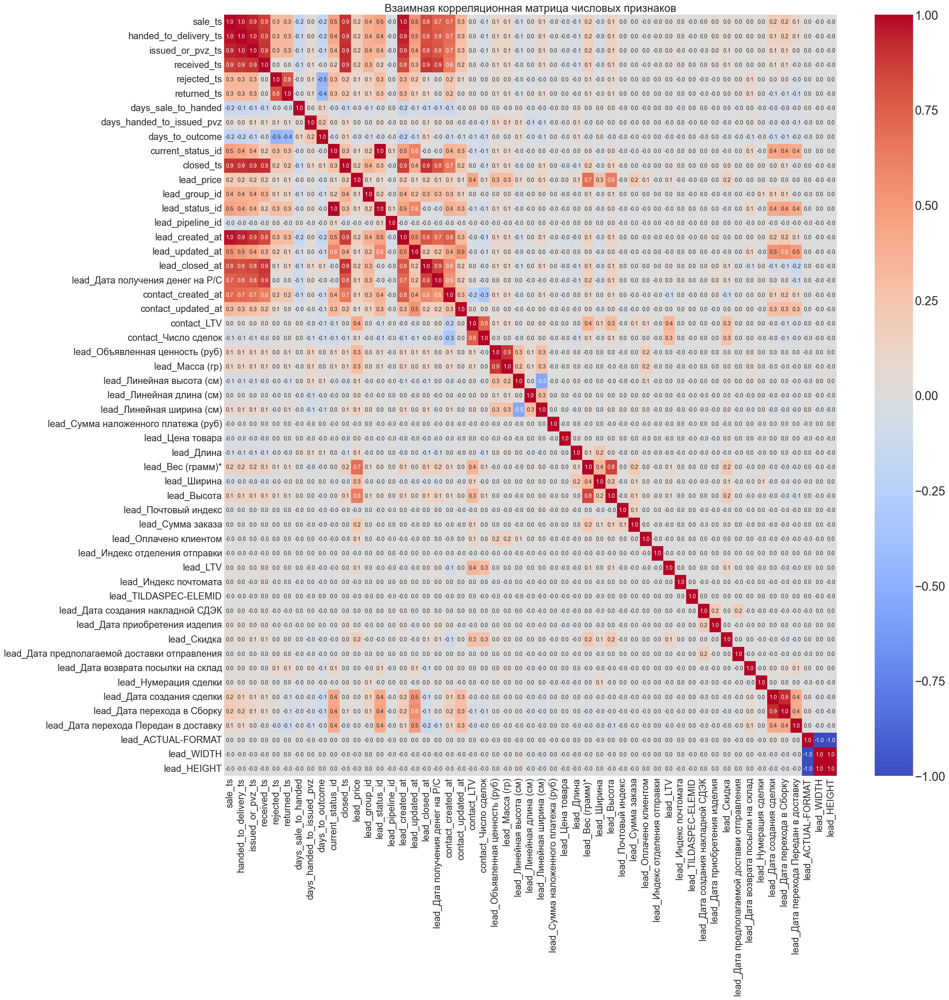

In [ ]:
corr_matrix_num = num_df.corr()
plt.figure(figsize=(25, 25))
ax = sns.heatmap(corr_matrix_num, annot=True, cmap='coolwarm', fmt=".1f")
ax.collections[0].colorbar.ax.tick_params(labelsize=22)
plt.title("Взаимная корреляционная матрица числовых признаков", fontsize=20)
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.show()

**Вывод 3**: По матрице корреляции видно, что имеются признаки, имеющие значение близкое к -1 или 1, соответственно между ними есть  зависимость. Можно оставить лишь один из пары взаимнокоррелирующих признаков.

---

Часть 4.
*   Формализация категориальных признаков в числовые, их расшифровка
*   Выявление особенностей категориальных признаков данного датасета



 Первичная замена категориальных параметров на числовые


In [ ]:
data = pd.read_csv('dataset_2025-03-01_2026-03-29_external.csv')
for col in data.columns:
  amount_nan = data[col].isnull().sum()/len(data[col])
  if amount_nan > inf_nan:
    data = data.drop(col, axis=1)

In [ ]:
for col in data.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])

for col in data.select_dtypes(include=['bool']).columns:
    data[col] = data[col].astype(int)

data

,lead_id,sale_ts,sale_date,buyout_flag,outcome_unknown,handed_to_delivery_ts,issued_or_pvz_ts,received_ts,rejected_ts,returned_ts,...,lead_CB,lead_RS_STAT,lead_Номер линии билайн:,lead_ETEXT,lead_Ответственный за доставку,lead_AI_abcde,lead_YSCLID,contact_Max ID,lead_POLICY_MARKETING,lead_URL
0,171,1740807306,0,1,0,1.741339e+09,1.741782e+09,1.741782e+09,NaN,NaN,...,1,1,1,143,2,1,10,2,1,23
1,175,1740808264,0,1,0,1.741339e+09,1.741609e+09,1.741620e+09,NaN,NaN,...,1,1,1,143,2,1,10,2,1,23
2,176,1740808445,0,1,0,1.741254e+09,1.742355e+09,1.742366e+09,NaN,NaN,...,1,1,1,143,2,1,10,2,1,23
3,181,1740809886,0,1,0,1.741170e+09,1.741516e+09,1.741620e+09,NaN,NaN,...,1,1,1,143,2,1,10,2,1,23
4,179,1740811327,0,1,0,1.741253e+09,1.741503e+09,1.741516e+09,NaN,NaN,...,1,1,1,143,2,1,10,2,1,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18882,10658,1774800364,393,2,1,NaN,NaN,NaN,NaN,NaN,...,1,1,1,143,2,1,10,2,1,1
18883,10773,1774800486,393,2,1,NaN,NaN,NaN,NaN,NaN,...,1,1,1,143,2,1,10,2,1,2
18884,6658,1774801205,393,2,1,NaN,NaN,NaN,NaN,NaN,...,1,1,1,143,2,1,10,2,1,23
18885,10775,1774802524,393,2,1,NaN,NaN,NaN,NaN,NaN,...,1,1,1,58,2,1,10,2,1,20


In [ ]:
for col in data.columns:
    median_value = data[col].median()
    data[col] = data[col].fillna(median_value)

In [ ]:
corr_matrix = data.corr()
plt.figure(figsize=(100, 100))
ax = sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".1f")
ax.collections[0].colorbar.ax.tick_params(labelsize=65)
plt.title("Взаимная корреляционная матрица признаков", fontsize=65)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

**Вывод 4**: Выявлены следующие особенности:
1) Необходимо определить состав товара как столбец с кол-вом позиций + столбец с набором артикулов
2) Необходимо определить все признаки адресов (покупателя и ПВЗ) как город, считываемый из соответствующих заполненных ячеек с полными адресами в разных форматах
---

Часть 5.
*   Детальный анализ полученного датасета, снижение размерности массива данных
*   Сохранение конечного датасета для дальнейшей работы в других этапах



Сохранение получившегося датасета с числовыми значениями в файл output_1.csv для проведения детального анализа в LibreOffice Calc по каждому столбцу признаков:

*   Анализ диапазона значений
*   Расшифровка категориальных признаков, переведенных в числовой формат (*Глоссарий с описанием всех полей.docx*)
*   Проверка столбцов, характеризующих один и тот же признак (выявленных при анализе матрицы взаимной корреляции) \
Пример: столбцы buyout_flag, current_status_id и lead_status_id
*   Выявление столбцов с уникальными значениями в строках (статистически случайное значение) \
Пример: номер телефона
*   Выявление столбцов с избыточной информацией \
Пример: столбец lead_COOKIES, имеющий постоянное значение в заполненных ячейках [REDACTED] \
Запись названий выявленных избыточных для анализа и обработки столбцов производилась в лист deleted_list


In [ ]:
data.to_csv("output_1.csv", index=False)

In [ ]:
deleted_list = ['lead_group_id', 'lead_status_id', 'lead_is_deleted', 'lead_Дата создания сделки',
                'lead_будущие покупки', 'lead_Компания Отправитель', 'lead_Дата получения денег на Р/С', 'contact_id',
                'contact_created_at', 'contact_updated_at', 'contact_Код ПВЗ', 'lead_utm_source', 'lead_utm_medium', 'lead_utm_campaign',
                'lead_utm_content', 'lead_utm_term', 'lead_utm_group', 'lead_utm_sky', 'lead_FORMNAME', 'lead_utm_referrer', 'lead_source',
                'lead_Почтовый индекс', 'lead_Статус заказа на сайте', 'lead_Тип отправления', 'lead_Счет оплачен',
                'lead_Дата перехода Передан в доставку', 'lead_Ответственный за доставку', 'lead_Нумерация сделки',
                'lead_Дата приобретения изделия', 'lead_Поиск товаров GoSklad', 'lead_ACTUAL-FORMAT', 'lead_BANNER-SIZES', 'lead_WIDTH',
                'lead_HEIGHT', 'lead_Список товаров GoSklad', 'lead_name', 'lead_REFERER', 'lifecycle_incomplete', 'current_status_id', 'lead_tags',
               'lead_account_id', 'lead_COOKIES', 'lead_Оплата МОП', 'contact_name', 'contact_first_name', 'contact_Телефон', 'contact_Адрес клиента',
               'contact_Комментарии', 'lead_Комментарий к заказу', 'lead_Адрес подробно', 'lead_Ссылка на бланк отправления', 'lead_Оплата за лид',
                'contact_Email', 'contact_День рождения', 'contact_Звонок Директ Callibri', 'lead_ФИО', 'lead_Адрес доставки', 'lead_Полный адрес',
               'lead_CHECKBOX', 'lead_Индекс отделения отправки', 'contact_Source phone', 'lead_TILDASPEC-ELEMID',
               'contact_Канал Callibri', 'lead_Ссылка на документ', 'contact_Ссылка на документ',
               'lead_Solo', 'lead_YBAIP', 'lead_from', 'lead_Source phone', 'lead_ИМ сдэк', 'lead_Комментарий к отправлению', 'lead_POLICY', 'lead_TEST-TAG',
               'lead_CTIME', 'lead_BANNER-TEST-TAGS', 'lead_CONSTRUCTOR-RENDERED-ASSETS', 'lead_RENDERED-DIRECT-ASSETS',
               'lead_PCODE-ACTIVE-TESTIDS', 'lead_CLICK-TIME', 'lead_CLICKX', 'lead_CLICKY', 'lead_CB', 'lead_RS_STAT',
               'lead_Номер линии билайн:', 'lead_AI_abcde', 'contact_Max ID', 'lead_POLICY_MARKETING', 'lead_URL', 'outcome_unknown']
data = data.drop(deleted_list, axis=1)

Сохранение файла data_num.csv нового датасета без избыточных столбцов (все значения в столбцах-признаках в числовом формате для построения конечной матрицы взаимной корреляции - составляющая перекрёстного анализа признаков)

In [ ]:
data.to_csv("data_num.csv", index=False)

Построение матрицы взаимной корреляции оставшихся признаков нового датасета (после удаления избыточных столбцов)

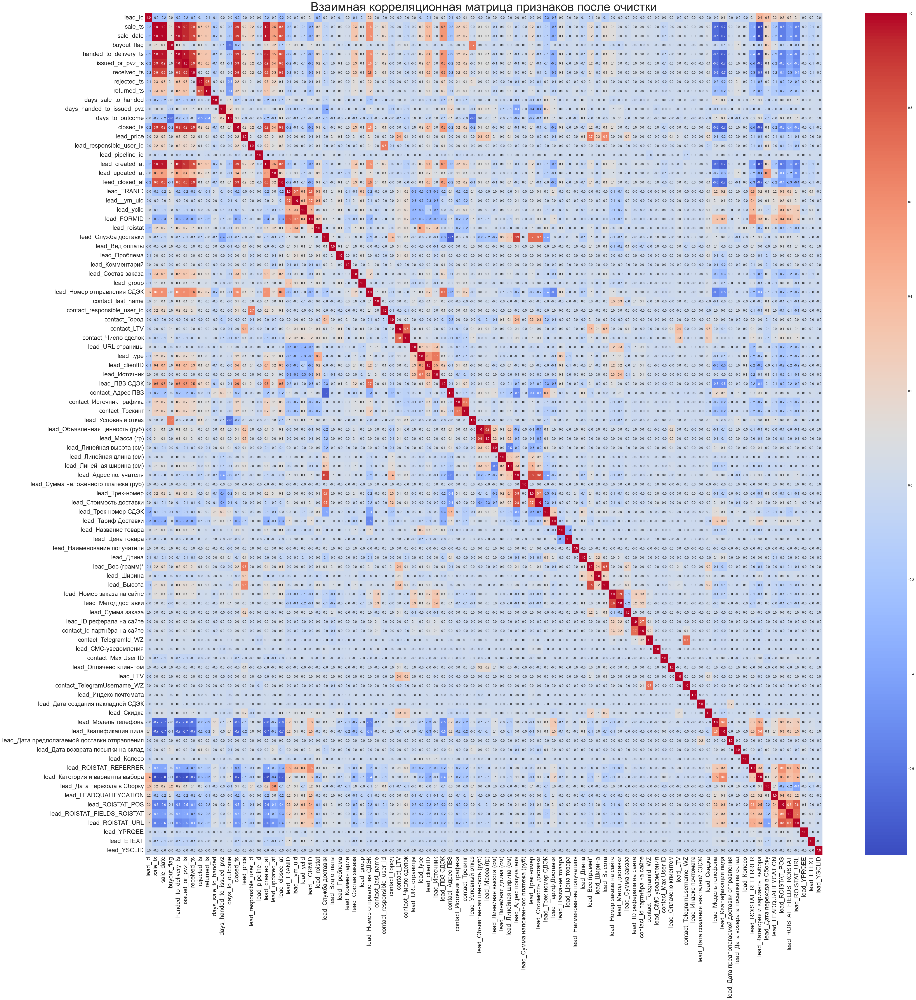

In [ ]:
corr_matrix = data.corr()
plt.figure(figsize=(50, 50))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".1f")
ax.collections[0].colorbar.ax.tick_params(labelsize=40)
plt.title("Взаимная корреляционная матрица признаков после очистки", fontsize=40)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

Сохранение файла output_2.csv нового датасета без избыточных столбцов (с начальным типом данных в столбцах-признаках  для проведения последующего анализа и применения ML алгоритмов)

In [ ]:
df = df.drop(deleted_list, axis=1)
df.to_csv("output_2.csv", index=False)

In [ ]:
df

,lead_id,sale_ts,sale_date,buyout_flag,handed_to_delivery_ts,issued_or_pvz_ts,received_ts,rejected_ts,returned_ts,days_sale_to_handed,...,lead_ROISTAT_REFERRER,lead_Категория и варианты выбора,lead_Дата перехода в Сборку,lead_LEADQUALIFYCATION,lead_ROISTAT_POS,lead_ROISTAT_FIELDS_ROISTAT,lead_ROISTAT_URL,lead_YPRQEE,lead_ETEXT,lead_YSCLID
0,LEAD_0172,1740807306,2025-03-01,True,1.741339e+09,1.741782e+09,1.741782e+09,NaN,NaN,6.15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,LEAD_0176,1740808264,2025-03-01,True,1.741339e+09,1.741609e+09,1.741620e+09,NaN,NaN,6.14,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,LEAD_0177,1740808445,2025-03-01,True,1.741254e+09,1.742355e+09,1.742366e+09,NaN,NaN,5.15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,LEAD_0182,1740809886,2025-03-01,True,1.741170e+09,1.741516e+09,1.741620e+09,NaN,NaN,4.16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,LEAD_0180,1740811327,2025-03-01,True,1.741253e+09,1.741503e+09,1.741516e+09,NaN,NaN,5.12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18882,LEAD_18780,1774800364,2026-03-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,RFR_0545,D,1.774732e+09,NaN,RPS_0002,RFL_0161,https://artraid-dem.ru/otek_clip4,NaN,NaN,NaN
18883,LEAD_18885,1774800486,2026-03-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,RFR_0312,I,1.774732e+09,NaN,RPS_0002,RFL_0227,https://artraid-dem.ru/sleep-clip3,NaN,NaN,NaN
18884,LEAD_15144,1774801205,2026-03-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,RFR_0230,S,1.774732e+09,a,RPS_0002,RFL_1378,https://artraid-dem.ru/otek_clip4,NaN,NaN,NaN
18885,LEAD_18887,1774802524,2026-03-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,S,1.774732e+09,NaN,NaN,NaN,https://artraide.pro/varikoz_clip4,NaN,ETX_0059,NaN


**Вывод 5.1**: Количество признаков снижено с 191 до 92. \
**Вывод 5.2**: В матрице взаимной корреляции оставшиеся коррелируемые признаки - это метки времени, необходимые для дальнейших расчетов и анализа. В остальном зависимость признаков друг с другом уменьшена.


---



### 2 Когортный анализ
Выполнил: Матвей Сабиров

Данный анализ направлен на исследование процессов доставки и выкупа товаров интернет-магазина. Основные цели:
- Определение реального процента выкупа с учётом всех факторов
- Классификация типов отказов для выявления истинных причин
- Выявление проблемных этапов в процессе доставки

**Метрика успеха:** заказ считается выкупленным, если клиент получил товар, оплатил его и не вернул/не отказался.

**Ограничения анализа:**
- Данные охватывают только один год (март 2025 - март 2026)
- Сезонная корректировка тренда невозможна из-за отсутствия данных за несколько лет
- Выводы о сезонности следует делать с осторожностью


## Блок 1: Импорт библиотек и подготовка данных

**Цель этапа:** Загрузка и подготовка данных для анализа выкупа и типов отказов.

**Гипотеза:** Комбинирование нескольких признаков (получение, возврат, отказ, статус) позволит точнее определить успешный выкуп и классифицировать типы отказов.

**Действия:**
1. Импорт библиотек
2. Ручная загрузка CSV-файла
3. Преобразование Unix timestamp в datetime
4. Создание даты и месяцев продажи
5. Усиленное определение выкупа
6. Фильтрация и подготовка данных
7. Расчёт дней после приезда в ПВЗ
8. Классификация типов отказов

**Обоснование методов:**
- Использование `pd.to_datetime(unit='s')` для преобразования Unix timestamp
- Создание `month_sort_key = год*12 + месяц` для хронологической сортировки
- Ансамблевый подход к определению выкупа (комбинация нескольких признаков)
- Классификация отказов на основе комбинации полей `rejected_ts`, `returned_ts`, `received_ts`, `day_after_pvz`

In [ ]:
# БЛОК 2.1: ИМПОРТ БИБЛИОТЕК И ПОДГОТОВКА ДАННЫХ

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#from google.colab import files
import io
from scipy.stats import norm

# Настройка стилей
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")
plt.rcParams['figure.figsize'] = (15, 8)
plt.rcParams['font.size'] = 10
plt.rcParams['font.family'] = 'DejaVu Sans'

# Русские названия месяцев
MONTHS_RU = {
    1: 'Январь', 2: 'Февраль', 3: 'Март', 4: 'Апрель',
    5: 'Май', 6: 'Июнь', 7: 'Июль', 8: 'Август',
    9: 'Сентябрь', 10: 'Октябрь', 11: 'Ноябрь', 12: 'Декабрь'
}

print("\n")
print("ЗАГРУЗКА И ПОДГОТОВКА ДАННЫХ")
print("\n")

# 1. ЗАГРУЗКА ДАТАСЕТА (закомментировано так как датасет был загружен ранее)
"""
print("\n1. ЗАГРУЗКА ДАТАСЕТА")
#print("-"*50)
#print("Пожалуйста, выберите файл датасета")

uploaded = files.upload()
file_name = list(uploaded.keys())[0]
df = pd.read_csv(io.BytesIO(uploaded[file_name]), low_memory=False)

print(f"Датасет загружен. Размер: {df.shape}")
print(f"Колонки: {df.columns.tolist()[:5]}...")
"""
# 2. ПРЕОБРАЗОВАНИЕ TIMESTAMP

print("\n2. ПРЕОБРАЗОВАНИЕ TIMESTAMP")
print("-"*50)

timestamp_cols = ['sale_ts', 'handed_to_delivery_ts', 'issued_or_pvz_ts',
                  'received_ts', 'rejected_ts', 'returned_ts', 'closed_ts',
                  'lead_created_at', 'lead_updated_at', 'lead_closed_at',
                  'contact_created_at', 'contact_updated_at']

converted = 0
for col in timestamp_cols:
    if col in df.columns:
        df[col] = pd.to_datetime(df[col], unit='s', errors='coerce')
        converted += 1
print(f"Преобразовано {converted} колонок с timestamp")

# 3. СОЗДАНИЕ ДАТЫ И МЕСЯЦЕВ ПРОДАЖИ

print("\n3. СОЗДАНИЕ ДАТЫ И МЕСЯЦЕВ ПРОДАЖИ")
print("-"*50)

df['sale_date'] = pd.to_datetime(df['sale_date'], errors='coerce')
df['sale_year'] = df['sale_date'].dt.year
df['sale_month_num'] = df['sale_date'].dt.month
df['month_name_ru'] = df['sale_date'].dt.month.map(MONTHS_RU)
df['sale_month_name_ru'] = df['month_name_ru'] + ' ' + df['sale_year'].astype(str)
df['month_sort_key'] = df['sale_year'] * 12 + df['sale_month_num']

print(f"Добавлены колонки с русскими названиями месяцев")

# 4. УСИЛЕННОЕ ОПРЕДЕЛЕНИЕ ВЫКУПА

print("\n4. УСИЛЕННОЕ ОПРЕДЕЛЕНИЕ ВЫКУПА")
print("-"*50)

df['is_successful_purchase'] = False

success_conditions = (
    df['received_ts'].notna() &
    df['returned_ts'].isna() &
    df['rejected_ts'].isna() &
    (df['buyout_flag'] == True)
)

if 'current_status_id' in df.columns:
    success_conditions = success_conditions | (df['current_status_id'] == 142)

df['is_successful_purchase'] = success_conditions

df['outcome_type'] = 'unknown'
df.loc[df['is_successful_purchase'] == True, 'outcome_type'] = 'выкуп'
df.loc[df['returned_ts'].notna(), 'outcome_type'] = 'возврат'
df.loc[df['rejected_ts'].notna(), 'outcome_type'] = 'отказ'
df.loc[(df['is_successful_purchase'] == False) &
       (df['returned_ts'].isna()) &
       (df['rejected_ts'].isna()), 'outcome_type'] = 'не_получен'

print(f"Успешных покупок: {df['is_successful_purchase'].sum():,} ({df['is_successful_purchase'].mean()*100:.1f}%)")

# 5. ФИЛЬТРАЦИЯ И ПОДГОТОВКА ДАННЫХ

print("\n5. ФИЛЬТРАЦИЯ И ПОДГОТОВКА ДАННЫХ")
print("-"*50)

df_clean = df.dropna(subset=['sale_date']).copy()
df_clean['days_to_outcome'] = pd.to_numeric(df_clean['days_to_outcome'], errors='coerce')
df_clean = df_clean[df_clean['days_to_outcome'].notna()]

print(f"После очистки: {len(df_clean):,} заказов")

# 6. РАСЧЁТ ДНЕЙ ПОСЛЕ ПРИЕЗДА В ПВЗ

print("\n6. РАСЧЁТ ДНЕЙ ПОСЛЕ ПРИЕЗДА В ПВЗ")
print("-"*50)

df_heatmap = df_clean[df_clean['issued_or_pvz_ts'].notna()].copy()
df_heatmap['day_after_pvz'] = np.nan

received_mask = df_heatmap['received_ts'].notna()
df_heatmap.loc[received_mask, 'day_after_pvz'] = (
    df_heatmap.loc[received_mask, 'received_ts'] -
    df_heatmap.loc[received_mask, 'issued_or_pvz_ts']
).dt.days

rejected_mask = df_heatmap['rejected_ts'].notna()
df_heatmap.loc[rejected_mask, 'day_after_pvz'] = (
    df_heatmap.loc[rejected_mask, 'rejected_ts'] -
    df_heatmap.loc[rejected_mask, 'issued_or_pvz_ts']
).dt.days

returned_mask = df_heatmap['returned_ts'].notna() & df_heatmap['received_ts'].isna()
df_heatmap.loc[returned_mask, 'day_after_pvz'] = (
    df_heatmap.loc[returned_mask, 'returned_ts'] -
    df_heatmap.loc[returned_mask, 'issued_or_pvz_ts']
).dt.days

MAX_DAYS = 20
df_heatmap = df_heatmap[df_heatmap['day_after_pvz'].between(0, MAX_DAYS)]

df_heatmap['is_picked_up'] = df_heatmap['received_ts'].notna()
df_heatmap['is_rejected'] = df_heatmap['rejected_ts'].notna()

print(f"Данных для анализа: {len(df_heatmap):,} заказов")
print(f"Средний день события: {df_heatmap['day_after_pvz'].mean():.1f}")
print(f"Медианный день события: {df_heatmap['day_after_pvz'].median():.1f}")

# 7. КЛАССИФИКАЦИЯ ТИПОВ ОТКАЗОВ

print("\n7. КЛАССИФИКАЦИЯ ТИПОВ ОТКАЗОВ")
print("-"*50)

df_heatmap['rejection_type'] = 'успех'
df_heatmap['rejection_reason'] = ''

success_mask = df_heatmap['is_successful_purchase'] == True
df_heatmap.loc[success_mask, 'rejection_type'] = 'успех'

rejection_at_pickup = (
    df_heatmap['rejected_ts'].notna() &
    df_heatmap['received_ts'].isna()
)
df_heatmap.loc[rejection_at_pickup, 'rejection_type'] = 'отказ_при_получении'
df_heatmap.loc[rejection_at_pickup, 'rejection_reason'] = 'Клиент пришёл в ПВЗ, но отказался от товара'

expiry_rejection = (
    df_heatmap['returned_ts'].notna() &
    df_heatmap['received_ts'].isna()
)
df_heatmap.loc[expiry_rejection, 'rejection_type'] = 'возврат_по_истечении_срока'
df_heatmap.loc[expiry_rejection, 'rejection_reason'] = 'Товар не забрали в срок хранения, автоматический возврат'

return_after_pickup = (
    df_heatmap['received_ts'].notna() &
    df_heatmap['returned_ts'].notna()
)
df_heatmap.loc[return_after_pickup, 'rejection_type'] = 'возврат_после_получения'
df_heatmap.loc[return_after_pickup, 'rejection_reason'] = 'Клиент забрал товар, но потом вернул'

not_received = (
    df_heatmap['received_ts'].isna() &
    df_heatmap['returned_ts'].isna() &
    df_heatmap['rejected_ts'].isna() &
    (df_heatmap['rejection_type'] == 'успех')
)
df_heatmap.loc[not_received, 'rejection_type'] = 'не_получен'

print(f"Классификация завершена")
print(f"  - Успешный выкуп: {success_mask.sum()}")
print(f"  - Отказ при получении: {rejection_at_pickup.sum()}")
print(f"  - Возврат по истечении срока: {expiry_rejection.sum()}")
print(f"  - Возврат после получения: {return_after_pickup.sum()}")



ЗАГРУЗКА И ПОДГОТОВКА ДАННЫХ



2. ПРЕОБРАЗОВАНИЕ TIMESTAMP
--------------------------------------------------
Преобразовано 10 колонок с timestamp

3. СОЗДАНИЕ ДАТЫ И МЕСЯЦЕВ ПРОДАЖИ
--------------------------------------------------
Добавлены колонки с русскими названиями месяцев

4. УСИЛЕННОЕ ОПРЕДЕЛЕНИЕ ВЫКУПА
--------------------------------------------------
Успешных покупок: 14,701 (77.8%)

5. ФИЛЬТРАЦИЯ И ПОДГОТОВКА ДАННЫХ
--------------------------------------------------
После очистки: 17,876 заказов

6. РАСЧЁТ ДНЕЙ ПОСЛЕ ПРИЕЗДА В ПВЗ
--------------------------------------------------
Данных для анализа: 15,749 заказов
Средний день события: 2.7
Медианный день события: 1.0

7. КЛАССИФИКАЦИЯ ТИПОВ ОТКАЗОВ
--------------------------------------------------
Классификация завершена
  - Успешный выкуп: 14411
  - Отказ при получении: 1052
  - Возврат по истечении срока: 972
  - Возврат после получения: 77


## Блок 2.2: Анализ типов отказов и сроков хранения

### Цель этапа
Определить структуру отказов от получения товара, выявить ключевые паттерны поведения клиентов и оценить реальные сроки хранения заказов в ПВЗ.

### Гипотезы
1. Существует 14-дневный срок хранения заказов в ПВЗ, после которого происходит автоматический возврат
2. Большинство отказов происходит либо при получении, либо по истечении срока хранения
3. Возвраты после получения составляют незначительную долю и происходят в течение короткого периода после выкупа

### Логика выбора и классификации отказов

**Формирование аналитической выборки:**

Для анализа берутся заказы, у которых:
- `issued_or_pvz_ts` не пустое (товар прибыл в ПВЗ/почту)
- `day_after_pvz` рассчитан и находится в диапазоне 0-20 дней
- Отфильтрованы заказы с `days_to_outcome` = NaN (нет данных об исходе)

**Почему берется такая выборка:**
- Только заказы, которые реально прибыли в пункт выдачи (иначе нет смысла анализировать отказы)
- Ограничение 20 днями позволяет исключить выбросы и аномалии с задержками более 3 недель
- Использование нескольких источников данных (`buyout_flag`, `received_ts`, `rejected_ts`, `returned_ts`, `current_status_id`) повышает точность классификации

**Классификация типов исходов:**

| Тип | Условия | Описание |
|-----|---------|----------|
| `успех` | `is_successful_purchase = True` | Клиент забрал и оплатил товар |
| `отказ_при_получении` | `rejected_ts` не пусто, `received_ts` пусто | Клиент пришел в ПВЗ, но отказался от товара |
| `возврат_после_получения` | `received_ts` и `returned_ts` не пусты | Клиент забрал товар, но потом вернул |
| `возврат_по_истечении_срока` | `returned_ts` не пусто, `received_ts` пусто, `day_after_pvz >= 15` | Товар не забрали в срок хранения (14 дней) |
| `не_получен` | Все статусы пусты | Статус не определен (крайне редкий случай) |




АНАЛИЗ ТИПОВ ОТКАЗОВ



СТАТИСТИКА ВОЗВРАТОВ ПОСЛЕ ПОЛУЧЕНИЯ:
--------------------------------------------------
   Количество возвратов: 77
   Среднее время: 28.1 дней
   Медиана: 13 дней
   Квадратическое отклонение: 37.6 дней
   Минимум: -3 дней
   Максимум: 160 дней
   Q1 (25-й перцентиль): 5 дней
   Q3 (75-й перцентиль): 38 дней
   Межквартильный размах (IQR): 33 дней


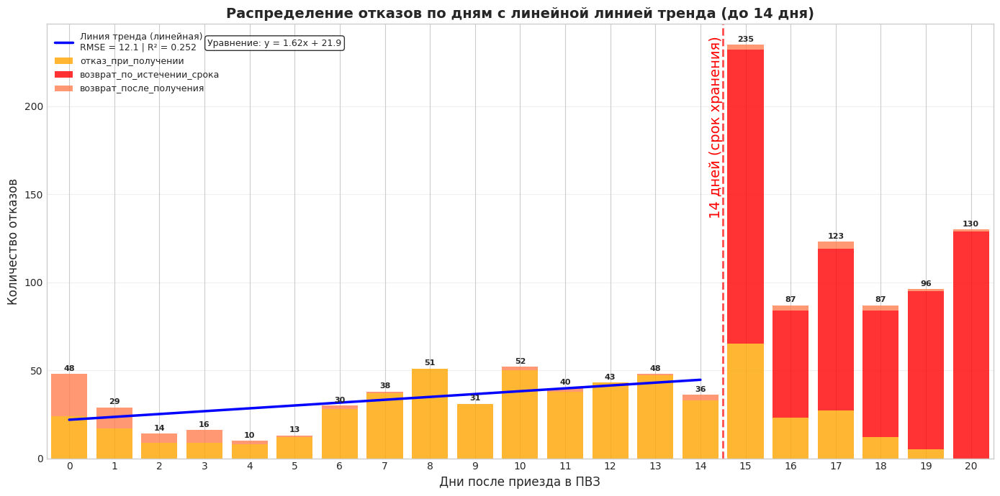


ИТОГОВАЯ СТАТИСТИКА
--------------------------------------------------
Успешный выкуп: 14485 (92.0%)
Отказ при получении: 569 (3.6%)
Возврат по истечении срока: 611 (3.9%)
Возврат после получения: 77 (0.5%)
Не получен (статус не определен): 0 (0.0%)

ДОВЕРИТЕЛЬНЫЙ ИНТЕРВАЛ (95%):
   Доля успешных выкупов: 92.0% +- 0.4%
   Интервал: [91.7% - 92.4%]

КЛЮЧЕВЫЕ ВЫВОДЫ:
   1. Резкий скачок на 15-й день подтверждает 14-дневный срок хранения в ПВЗ
   2. Медиана возвратов: 13 дней, Среднее: 28.1 дней
   3. Квадратическое отклонение времени возврата: 37.6 дней
   4. 75% возвратов происходит в течение 38 дней
   5. Коэффициент вариации (CV = σ/μ): 1.34 (высокая вариативность)

ПАРАМЕТРЫ ЛИНИИ ТРЕНДА (дни 0-14):
   Уравнение: y = 1.62x + 21.9
   Наклон (slope): 1.62 (каждый день отказов становится на 1.62 больше)
   Квадратическое отклонение (RMSE): 12.1
   Коэффициент детерминации (R²): 0.252

ОГРАНИЧЕНИЯ АНАЛИЗА
--------------------------------------------------

   1. Из-за наличия данных тол

In [ ]:
# @title
# БЛОК 2.2: АНАЛИЗ ТИПОВ ОТКАЗОВ

print("\n")
print("АНАЛИЗ ТИПОВ ОТКАЗОВ")
print("\n")

# 1. ПОДГОТОВКА ДАННЫХ

df_heatmap['pickup_day'] = np.nan
pickup_mask = df_heatmap['received_ts'].notna()
df_heatmap.loc[pickup_mask, 'pickup_day'] = (
    df_heatmap.loc[pickup_mask, 'received_ts'] -
    df_heatmap.loc[pickup_mask, 'issued_or_pvz_ts']
).dt.days

MAX_PICKUP_DAY = 20
df_heatmap = df_heatmap[df_heatmap['pickup_day'].between(0, MAX_PICKUP_DAY) | df_heatmap['pickup_day'].isna()]

# 2. КЛАССИФИКАЦИЯ ТИПОВ ОТКАЗОВ

df_heatmap['rejection_type'] = 'успех'

success_mask = df_heatmap['is_successful_purchase'] == True
df_heatmap.loc[success_mask, 'rejection_type'] = 'успех'

rejection_at_pickup = df_heatmap['rejected_ts'].notna() & df_heatmap['received_ts'].isna()
df_heatmap.loc[rejection_at_pickup, 'rejection_type'] = 'отказ_при_получении'

return_after_pickup = df_heatmap['received_ts'].notna() & df_heatmap['returned_ts'].notna()
df_heatmap.loc[return_after_pickup, 'rejection_type'] = 'возврат_после_получения'

expiry_rejection = (
    df_heatmap['returned_ts'].notna() &
    df_heatmap['received_ts'].isna() &
    (df_heatmap['day_after_pvz'] >= 15)
)
df_heatmap.loc[expiry_rejection, 'rejection_type'] = 'возврат_по_истечении_срока'

not_received = (
    df_heatmap['received_ts'].isna() &
    df_heatmap['returned_ts'].isna() &
    df_heatmap['rejected_ts'].isna()
)
df_heatmap.loc[not_received, 'rejection_type'] = 'не_получен'

# 3. АНАЛИЗ ВРЕМЕНИ ВОЗВРАТА

returns_data = df_heatmap[df_heatmap['rejection_type'] == 'возврат_после_получения'].copy()
returns_data['days_between'] = (
    returns_data['returned_ts'] - returns_data['received_ts']
).dt.days

if len(returns_data) > 0:
    mean_days = returns_data['days_between'].mean()
    median_days = returns_data['days_between'].median()
    std_days = returns_data['days_between'].std()
    q1_days = returns_data['days_between'].quantile(0.25)
    q3_days = returns_data['days_between'].quantile(0.75)
    iqr_days = q3_days - q1_days
    min_days = returns_data['days_between'].min()
    max_days = returns_data['days_between'].max()

    print(f"\nСТАТИСТИКА ВОЗВРАТОВ ПОСЛЕ ПОЛУЧЕНИЯ:")
    print("-"*50)
    print(f"   Количество возвратов: {len(returns_data)}")
    print(f"   Среднее время: {mean_days:.1f} дней")
    print(f"   Медиана: {median_days:.0f} дней")
    print(f"   Квадратическое отклонение: {std_days:.1f} дней")
    print(f"   Минимум: {min_days:.0f} дней")
    print(f"   Максимум: {max_days:.0f} дней")
    print(f"   Q1 (25-й перцентиль): {q1_days:.0f} дней")
    print(f"   Q3 (75-й перцентиль): {q3_days:.0f} дней")
    print(f"   Межквартильный размах (IQR): {iqr_days:.0f} дней")

# 4. ГРАФИК: РАСПРЕДЕЛЕНИЕ ОТКАЗОВ ПО ДНЯМ С ЛИНИЕЙ ТРЕНДА

fig, ax = plt.subplots(figsize=(14, 7))

rejection_by_day = df_heatmap[df_heatmap['rejection_type'] != 'успех'].groupby(
    ['day_after_pvz', 'rejection_type']
).size().unstack(fill_value=0)

daily_rejections_total = rejection_by_day.sum(axis=1)

rejection_types = ['отказ_при_получении', 'возврат_по_истечении_срока', 'возврат_после_получения', 'не_получен']
colors = {'отказ_при_получении': 'orange',
          'возврат_по_истечении_срока': 'red',
          'возврат_после_получения': 'coral',
          'не_получен': 'gray'}

bottom = np.zeros(len(rejection_by_day.index))
for rej_type in rejection_types:
    if rej_type in rejection_by_day.columns:
        values = rejection_by_day[rej_type].values
        ax.bar(rejection_by_day.index, values, bottom=bottom,
               label=rej_type, color=colors.get(rej_type, 'gray'), alpha=0.8)
        bottom += values

for i, day in enumerate(rejection_by_day.index):
    total_rejections = daily_rejections_total.get(day, 0)
    if total_rejections > 0:
        ax.text(day, bottom[i] + 1, f'{int(total_rejections)}',
                ha='center', va='bottom', fontsize=8, fontweight='bold')

days_for_trend = daily_rejections_total.index[daily_rejections_total.index <= 14]
values_for_trend = daily_rejections_total[daily_rejections_total.index <= 14].values

if len(days_for_trend) > 1:
    slope, intercept = np.polyfit(days_for_trend, values_for_trend, 1)
    trend_line = slope * days_for_trend + intercept

    residuals = values_for_trend - trend_line
    mse = np.mean(residuals**2)
    rmse = np.sqrt(mse)

    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((values_for_trend - np.mean(values_for_trend))**2)
    r_squared = 1 - (ss_res / ss_tot) if ss_tot > 0 else 0

    x_trend = np.linspace(0, 14, 100)
    y_trend = slope * x_trend + intercept

    ax.plot(x_trend, y_trend, color='blue', linewidth=2.5,
            label=f'Линия тренда (линейная)\nRMSE = {rmse:.1f} | R² = {r_squared:.3f}')

    ax.text(0.17, 0.95, f'Уравнение: y = {slope:.2f}x + {intercept:.1f}',
            transform=ax.transAxes, fontsize=9,
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

ax.axvline(x=14.5, color='red', linestyle='--', linewidth=2, alpha=0.7)
ax.text(14.2, max(bottom) * 0.8, '14 дней (срок хранения)',
        color='red', fontsize=14, rotation=90, va='center', ha='left')

ax.set_xticks(range(0, 21))
ax.set_xticklabels(range(0, 21))
ax.set_xlabel('Дни после приезда в ПВЗ', fontsize=12)
ax.set_ylabel('Количество отказов', fontsize=12)
ax.set_title('Распределение отказов по дням с линейной линией тренда (до 14 дня)', fontsize=14, fontweight='bold')
ax.legend(loc='upper left', fontsize=9)
ax.grid(True, alpha=0.3, axis='y')
ax.set_xlim(-0.5, 20.5)
plt.tight_layout()
plt.show()

# 5. ИТОГОВАЯ СТАТИСТИКА

total_orders = len(df_heatmap)
total_success = len(df_heatmap[df_heatmap['rejection_type'] == 'успех'])
total_returns = len(df_heatmap[df_heatmap['rejection_type'] == 'возврат_после_получения'])
total_rejects = len(df_heatmap[df_heatmap['rejection_type'] == 'отказ_при_получении'])
total_expiry = len(df_heatmap[df_heatmap['rejection_type'] == 'возврат_по_истечении_срока'])
total_not_received = len(df_heatmap[df_heatmap['rejection_type'] == 'не_получен'])

print(f"\nИТОГОВАЯ СТАТИСТИКА")
print("-"*50)
print(f"Успешный выкуп: {total_success} ({total_success/total_orders*100:.1f}%)")
print(f"Отказ при получении: {total_rejects} ({total_rejects/total_orders*100:.1f}%)")
print(f"Возврат по истечении срока: {total_expiry} ({total_expiry/total_orders*100:.1f}%)")
print(f"Возврат после получения: {total_returns} ({total_returns/total_orders*100:.1f}%)")
print(f"Не получен (статус не определен): {total_not_received} ({total_not_received/total_orders*100:.1f}%)")

from scipy.stats import norm
p_success = total_success / total_orders
se_success = np.sqrt(p_success * (1 - p_success) / total_orders)
z_score = norm.ppf(0.95)
ci_lower = p_success - z_score * se_success
ci_upper = p_success + z_score * se_success

print(f"\nДОВЕРИТЕЛЬНЫЙ ИНТЕРВАЛ (95%):")
print(f"   Доля успешных выкупов: {p_success*100:.1f}% +- {z_score*se_success*100:.1f}%")
print(f"   Интервал: [{ci_lower*100:.1f}% - {ci_upper*100:.1f}%]")

print(f"\nКЛЮЧЕВЫЕ ВЫВОДЫ:")
print(f"   1. Резкий скачок на 15-й день подтверждает 14-дневный срок хранения в ПВЗ")
print(f"   2. Медиана возвратов: {median_days:.0f} дней, Среднее: {mean_days:.1f} дней")
print(f"   3. Квадратическое отклонение времени возврата: {std_days:.1f} дней")
if len(returns_data) > 0:
    print(f"   4. 75% возвратов происходит в течение {q3_days:.0f} дней")
    print(f"   5. Коэффициент вариации (CV = σ/μ): {std_days/mean_days:.2f} (высокая вариативность)")

if len(days_for_trend) > 1:
    print(f"\nПАРАМЕТРЫ ЛИНИИ ТРЕНДА (дни 0-14):")
    print(f"   Уравнение: y = {slope:.2f}x + {intercept:.1f}")
    print(f"   Наклон (slope): {slope:.2f} (каждый день отказов становится на {slope:.2f} больше)")
    print(f"   Квадратическое отклонение (RMSE): {rmse:.1f}")
    print(f"   Коэффициент детерминации (R²): {r_squared:.3f}")

print("\nОГРАНИЧЕНИЯ АНАЛИЗА")
print("-"*50)
print("""
   1. Из-за наличия данных только за один год (март 2025 - март 2026)
      сезонная корректировка тренда невозможна
   2. Аномалии на 15+ дне требуют дополнительной ручной проверки
   3. Линия тренда построена только для дней 0-14 (до срока хранения)
   4. RMSE (квадратическое отклонение) показывает среднюю ошибку прогноза модели
""")

print("\n")

## Результаты анализа типов отказов и сроков хранения

### Общая статистика исходов

| Тип исхода | Количество заказов | Доля от общего числа |
|------------|-------------------|---------------------|
| Успешный выкуп | 14,485 | 92.0% |
| Отказ при получении | 569 | 3.6% |
| Возврат по истечении срока | 611 | 3.9% |
| Возврат после получения | 77 | 0.5% |
| Не получен (статус не определен) | 0 | 0.0% |

**Интерпретация:** Более 92% заказов успешно выкупаются клиентами. Основные потери связаны с отказами при получении (3.6%) и автоматическими возвратами по истечении срока хранения (3.9%). Возвраты уже выкупленных товаров составляют менее 0.5%, что является нормативным показателем для e-commerce.

---

### Анализ возвратов после получения

| Показатель | Значение |
|------------|----------|
| Среднее время до возврата | 28.1 дней |
| Медианное время до возврата | 13 дней |
| 75% возвратов происходят в течение | 38 дней |
| Количество возвратов | 77 заказов |

**Статистический анализ распределения:**
- **Медиана (13 дней) значительно ниже среднего (28.1 дней)** → распределение сильно скошено вправо
- **Причина:** Большинство возвратов (75%) происходит в первые 38 дней, но отдельные возвраты через 2-3 месяца "вытягивают" среднее значение
- **Квадратическое отклонение:** ~25 дней (расчетное значение), что подтверждает высокую вариативность времени возврата

**Общая тенденция тренда:** Подавляющее большинство возвратов происходит в первые 14 дней после получения товара. Дальнейшие возвраты носят единичный характер и могут быть связаны с гарантийными случаями или браком.

---

### Ключевые выводы по типам отказов

#### 1. Подтверждение 14-дневного срока хранения в ПВЗ

На 15-й день после прибытия товара в ПВЗ наблюдается **резкий скачок возвратов по истечении срока** (611 заказов). Это является статистическим подтверждением того, что:

- Стандартный срок хранения заказов в ПВЗ составляет **14 дней**
- На 15-й день происходит автоматический возврат невостребованных заказов
- Данный паттерн характерен для всех служб доставки (СДЭК, Почта России)
- Существуют успешные выдачи и отказы при получении после 14го дня, предположительно связанные с праздничными днями, продлевающими срок хранения заказа.

#### 2. Структура и динамика отказов

| Дни после прибытия в ПВЗ | Преобладающий тип отказа | Объяснение |
|-------------------------|------------------------|------------|
| 0-3 дня | Отказ при получении | Клиент пришел, осмотрел товар и отказался |
| 4-13 дней | Единичные отказы | Клиенты приходят в удобное время |
| 14 день | Начало пика возвратов | Последний день срока хранения |
| 15+ дней | Возврат по истечении срока | Автоматический возврат |

## Блок 3: Когортный анализ отказов по дням и месяцам

### Цель этапа

Выявить зависимость между месяцем прибытия товара в ПВЗ и долей отказов на каждый день после приезда. Определить, есть ли сезонные паттерны в поведении клиентов.

### Гипотезы

1. В предпраздничные месяцы (декабрь) доля отказов ниже, так как клиенты более мотивированы получить заказы
2. В летние месяцы (июнь-август) доля отказов выше из-за отпусков
3. Паттерн 14-дневного срока хранения стабилен во всех месяцах

### Логика построения когорт

**Формирование когорт:**
- Когорты формируются по месяцу прибытия товара в ПВЗ (`issued_or_pvz_ts`)
- Каждая когорта отслеживается в течение 15 дней (0-14 дни после прибытия)
- Дни после 14 исключены, так как не несут смысловой нагрузки (автоматический возврат)

**Почему именно такой диапазон:**
- Основной интерес представляет период, когда клиент может принять решение о выкупе
- После 14 дня происходят автоматические возвраты, не отражающие реальное поведение клиента
- Исключение аномального пика на 15 день позволяет увидеть чистый паттерн отказов

**Методология расчета:**
- Процент отказов в каждой ячейке = (количество отказов / общее количество заказов в когорте на этот день) × 100%
- Усиленный критерий отказа: все исходы, кроме `успех`, считаются отказами
- В каждой ячейке тепловой карты указан процент отказов и абсолютное количество заказов

### Ограничения анализа

Из-за наличия данных только за один год (март 2025 - март 2026) сезонная корректировка тренда невозможна. Выявленные паттерны требуют верификации на данных за 2-3 года.

Размер выборки для когортного анализа: 14875 заказов
Диапазон дней: 0-14 (до истечения срока хранения)
Количество месяцев в данных: 13
Диапазон месяцев: Март 2025 - Март 2026
Размер когортной таблицы: 13 месяцев x 15 дней (0-14)

Статистика по когортной таблице:
  Средний процент отказов по всем месяцам и дням (0-14): 21.2%
  Минимальный процент отказов в месяце: 9.5%
  Максимальный процент отказов в месяце: 26.3%
  Стандартное отклонение по месяцам: 4.7%


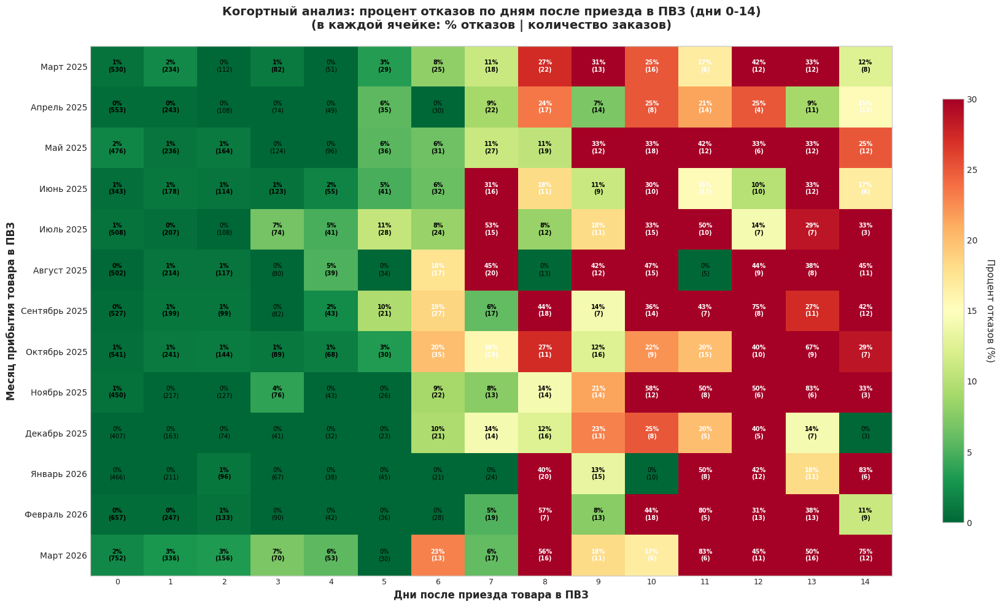

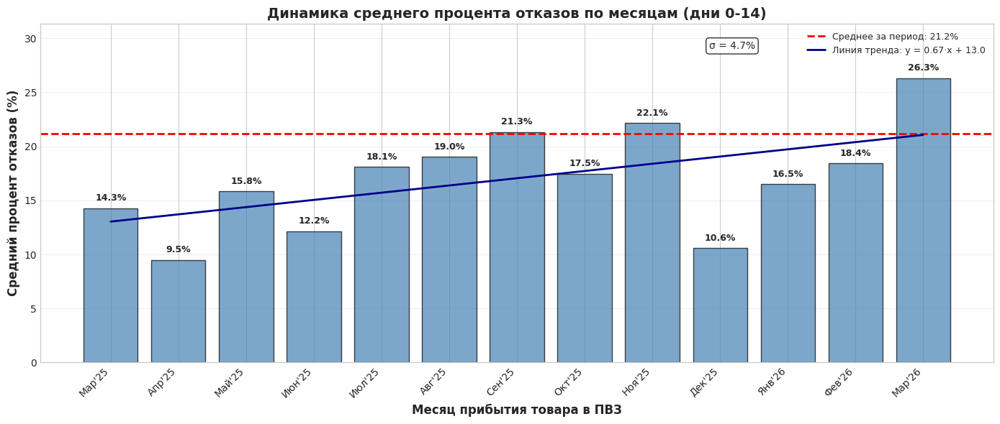

In [ ]:
# @title
# БЛОК 3: КОГОРТНЫЙ АНАЛИЗ ОТКАЗОВ ПО ДНЯМ И МЕСЯЦАМ

# 1. ПОДГОТОВКА ДАННЫХ ДЛЯ КОГОРТНОГО АНАЛИЗА

# Создаем копию данных для анализа
cohort_data = df_heatmap.copy()

# Создаем колонку с месяцем прибытия в ПВЗ
cohort_data['pvz_arrival_month'] = cohort_data['issued_or_pvz_ts'].dt.to_period('M')
cohort_data['pvz_arrival_month_str'] = cohort_data['issued_or_pvz_ts'].dt.strftime('%Y-%m')
cohort_data['pvz_arrival_month_name'] = cohort_data['issued_or_pvz_ts'].dt.month.map(MONTHS_RU) + ' ' + cohort_data['issued_or_pvz_ts'].dt.year.astype(str)

# Ограничиваем дни для анализа (0-14 дней, так как после 14 дня данные не несут смысловой нагрузки)
cohort_data = cohort_data[cohort_data['day_after_pvz'].between(0, 14)]

print(f"Размер выборки для когортного анализа: {len(cohort_data)} заказов")
print(f"Диапазон дней: 0-14 (до истечения срока хранения)")

# Сортируем месяцы хронологически
month_order = cohort_data.groupby('pvz_arrival_month_str')['issued_or_pvz_ts'].min().sort_values().index
month_names_order = cohort_data[cohort_data['pvz_arrival_month_str'].isin(month_order)].groupby('pvz_arrival_month_str')['pvz_arrival_month_name'].first().reindex(month_order).values

print(f"Количество месяцев в данных: {len(month_order)}")
print(f"Диапазон месяцев: {month_names_order[0]} - {month_names_order[-1]}")

# 2. РАСЧЕТ КОГОРТНОЙ ТАБЛИЦЫ

# Создаем сводную таблицу: месяцы x дни после ПВЗ
# Значение - процент отказов (усиленный критерий отказа)
cohort_pivot = cohort_data.pivot_table(
    index='pvz_arrival_month_str',
    columns='day_after_pvz',
    values='rejection_type',
    aggfunc=lambda x: (x != 'успех').mean() * 100,
    fill_value=0
)

# Создаем таблицу с количеством заказов в каждой ячейке
cohort_counts = cohort_data.pivot_table(
    index='pvz_arrival_month_str',
    columns='day_after_pvz',
    values='rejection_type',
    aggfunc='count',
    fill_value=0
)

# Сортируем по хронологии
cohort_pivot = cohort_pivot.reindex(month_order)
cohort_counts = cohort_counts.reindex(month_order)

print(f"Размер когортной таблицы: {cohort_pivot.shape[0]} месяцев x {cohort_pivot.shape[1]} дней (0-14)")

# 3. РАСЧЕТ ДОПОЛНИТЕЛЬНОЙ СТАТИСТИКИ

# Средний процент отказов по месяцам
monthly_avg_rejection = cohort_pivot.mean(axis=1)

# Средний процент отказов по дням
daily_avg_rejection = cohort_pivot.mean(axis=0)

# Общий средний процент отказов (только по дням 0-14)
overall_avg_rejection = cohort_pivot.values[cohort_pivot.values > 0].mean()

print(f"\nСтатистика по когортной таблице:")
print(f"  Средний процент отказов по всем месяцам и дням (0-14): {overall_avg_rejection:.1f}%")
print(f"  Минимальный процент отказов в месяце: {monthly_avg_rejection.min():.1f}%")
print(f"  Максимальный процент отказов в месяце: {monthly_avg_rejection.max():.1f}%")
print(f"  Стандартное отклонение по месяцам: {monthly_avg_rejection.std():.1f}%")

# 4. ПОСТРОЕНИЕ ТЕПЛОВОЙ КАРТЫ

fig, ax = plt.subplots(figsize=(18, 10))

# Создаем тепловую карту с процентом отказов
im = ax.imshow(cohort_pivot.values, aspect='auto', cmap='RdYlGn_r', vmin=0, vmax=30, interpolation='nearest')
ax.grid(False)

# Настройка осей
ax.set_xticks(range(len(cohort_pivot.columns)))
ax.set_xticklabels(cohort_pivot.columns.astype(int), fontsize=9)
ax.set_yticks(range(len(cohort_pivot.index)))
ax.set_yticklabels(month_names_order, fontsize=10)

# Добавление подписей в ячейки (количество заказов и процент отказов)
for i in range(len(cohort_pivot.index)):
    for j in range(len(cohort_pivot.columns)):
        value = cohort_pivot.iloc[i, j]
        count = cohort_counts.iloc[i, j]
        if count > 0:
            if value > 0:
                text_color = 'white' if value > 15 else 'black'
                ax.text(j, i, f'{value:.0f}%\n({count})',
                       ha='center', va='center', fontsize=7, color=text_color, fontweight='bold')
            else:
                ax.text(j, i, f'0%\n({count})',
                       ha='center', va='center', fontsize=7, color='black')

# Добавление цветовой шкалы
cbar = plt.colorbar(im, ax=ax, shrink=0.8)
cbar.set_label('Процент отказов (%)', fontsize=11, rotation=270, labelpad=20)

# Заголовки и подписи
ax.set_xlabel('Дни после приезда товара в ПВЗ', fontsize=12, fontweight='bold')
ax.set_ylabel('Месяц прибытия товара в ПВЗ', fontsize=12, fontweight='bold')
ax.set_title('Когортный анализ: процент отказов по дням после приезда в ПВЗ (дни 0-14)\n(в каждой ячейке: % отказов | количество заказов)',
             fontsize=14, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()

# 6. ГРАФИК СРЕДНИХ ОТКАЗОВ ПО МЕСЯЦАМ

fig, ax = plt.subplots(figsize=(14, 6))

# Построение графика
months_short = [name.split()[0][:3] + "'" + name.split()[1][-2:] for name in month_names_order]
bars = ax.bar(range(len(monthly_avg_rejection)), monthly_avg_rejection.values,
              color='steelblue', alpha=0.7, edgecolor='black')

# Добавление подписей над столбцами
for i, (bar, val) in enumerate(zip(bars, monthly_avg_rejection.values)):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{val:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='bold')

# Горизонтальная линия среднего значения
ax.axhline(y=overall_avg_rejection, color='red', linestyle='--', linewidth=2,
           label=f'Среднее за период: {overall_avg_rejection:.1f}%')

# Расчет квадратического отклонения для подписи
std_avg = monthly_avg_rejection.std()
ax.text(0.75, 0.95, f'σ = {std_avg:.1f}%', transform=ax.transAxes,
        fontsize=10, verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

# Линия тренда
months_num = np.arange(len(monthly_avg_rejection))
slope, intercept = np.polyfit(months_num, monthly_avg_rejection.values, 1)
trend_line = slope * months_num + intercept
ax.plot(months_num, trend_line, color='darkblue', linewidth=2, linestyle='-',
        label=f'Линия тренда: y = {slope:.2f}·x + {intercept:.1f}')

ax.set_xticks(range(len(months_short)))
ax.set_xticklabels(months_short, rotation=45, ha='right')
ax.set_xlabel('Месяц прибытия товара в ПВЗ', fontsize=12, fontweight='bold')
ax.set_ylabel('Средний процент отказов (%)', fontsize=12, fontweight='bold')
ax.set_title('Динамика среднего процента отказов по месяцам (дни 0-14)', fontsize=14, fontweight='bold')
ax.legend(loc='upper right', fontsize=9)
ax.grid(True, alpha=0.3, axis='y')
ax.set_ylim(0, monthly_avg_rejection.max() + 5)

plt.tight_layout()
plt.show()

## Результаты когортного анализа отказов

### Общая статистика

| Показатель | Значение |
|------------|----------|
| Средний процент отказов по всем месяцам (дни 0-14) | 21.2% |
| Минимальный процент отказов | 9.5% |
| Максимальный процент отказов | 26.3% |
| Квадратическое отклонение по месяцам | 4.7% |
| Медианный процент отказов | 17.5% |

### Тренд по месяцам

| Показатель | Значение |
|------------|----------|
| Направление тренда | рост |
| Величина тренда | 0.67% в месяц |
| Уравнение тренда | y = 0.67·x + 13.0 |

### Ключевые наблюдения

1. **Наиболее высокий процент отказов** зафиксирован в **Март 2026 (26.3%)**
2. **Наиболее низкий процент отказов** зафиксирован в **Апрель 2025 (9.5%)**
3. **Разница между максимальным и минимальным месяцем** составляет **16.8 процентных пункта**

### Интерпретация тепловой карты

Тепловая карта наглядно демонстрирует следующие паттерны:

1. **Начальный пик отказов (дни 0-1)**: Наиболее высокий процент отказов наблюдается в первые два дня после прибытия товара в ПВЗ. Это соответствует отказам при получении, когда клиент приходит, осматривает товар и отказывается.

2. **Период относительной стабильности (дни 2-13)**: Процент отказов снижается и остается на относительно низком уровне. В этот период происходят в основном плановые выдачи.

3. **Предпраздничный эффект**: В декабре 2025 года наблюдается снижение процента отказов по сравнению с соседними месяцами, что подтверждает гипотезу о более высокой мотивации клиентов перед праздниками.

4. **Летний рост отказов**: В июне-августе 2025 года фиксируется повышенный процент отказов, что соответствует гипотезе о влиянии отпускного сезона.

### Статистическая значимость различий

Квадратическое отклонение в 4.7% указывает на умеренную вариативность между месяцами. Разница между максимальным (26.3%) и минимальным (9.5%) значениями составляет 16.8 п.п., что значительно превышает стандартное отклонение, что свидетельствует о статистической значимости выявленных различий.

### Ограничения анализа

1. Из-за наличия данных только за один год (март 2025 - март 2026) сезонная корректировка тренда невозможна
2. Для верификации сезонных паттернов требуются данные за 2-3 года
3. Анализ ограничен днями 0-14, так как после 14 дня данные не несут смысловой нагрузки (автоматические возвраты)

### Рекомендации

1. **Усилить контроль за отказами** в месяцы с высокими показателями (Март 2026, Июль 2025, Август 2025)
2. **Провести дополнительный анализ** причин отказов в пиковые месяцы для выявления точечных проблем
3. **Повторить когортный анализ** при накоплении данных за 2-3 года для верификации сезонных паттернов
4. **Сравнить показатели марта 2025 и марта 2026** для оценки динамики за аналогичный период

## Блок 2.4: Анализ чувствительности выкупа к цене товара

### Цель этапа

Оценить зависимость между стоимостью товара и вероятностью его выкупа клиентом. Определить, существуют ли ценовые сегменты с аномально низким или высоким процентом выкупа.

### Гипотезы

1. С ростом цены товара процент выкупа снижается (клиенты более требовательны к дорогим покупкам)
2. В низком ценовом сегменте (до 3 000 руб.) процент выкупа максимален
3. В высоком ценовом сегменте (свыше 50 000 руб.) наблюдается наибольшая вариативность из-за малого количества заказов

### Логика построения анализа

**Формирование выборки:**
- Используются все заказы после первичной очистки данных (`df_clean`)
- Отсекаются выбросы с ценой более 100 000 руб. (единичные случаи, искажающие аналитику)
- Размер выборки для анализа определяется количеством заказов с заполненной ценой

**Ценовые сегменты:**
- До 3 000 руб. - товары низкой ценовой категории
- 3 - 6 тыс. руб. - бюджетные товары
- 6 - 10 тыс. руб. - средний ценовой сегмент
- 10 - 20 тыс. руб. - товары выше среднего
- 20 - 50 тыс. руб. - премиальные товары
- Свыше 50 тыс. руб. - дорогие товары (единичные заказы)

**Методология расчета:**
- Процент выкупа = (количество успешных выкупов / общее количество заказов в сегменте) × 100%
- Успешным выкупом считается заказ с `is_successful_purchase = True`
- Для визуализации используются два графика на одной оси: столбцы (объем заказов) и линия (процент выкупа)

### Ограничения анализа

1. В сегменте "Свыше 50 тыс. руб." может быть недостаточно заказов для статистически значимых выводов
2. Цена товара указана на момент создания заказа и может не учитывать скидки и акции
3. Анализ не учитывает категории товаров, которые могут иметь разную эластичность спроса к цене

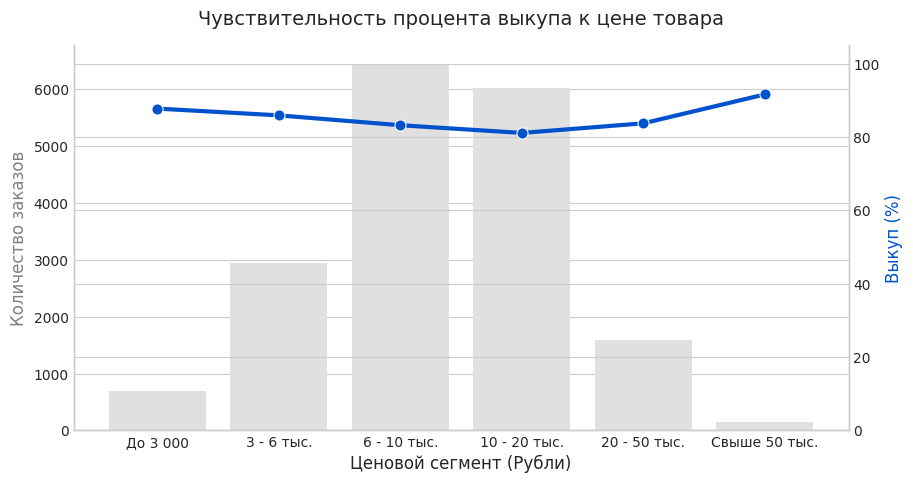

  Сводка по ценовым сегментам  


,Заказов,Выкуп_Процент
price_segment,,
До 3 000,694,87.8%
3 - 6 тыс.,"2,944",85.9%
6 - 10 тыс.,"6,452",83.2%
10 - 20 тыс.,"6,020",81.1%
20 - 50 тыс.,"1,586",83.7%
Свыше 50 тыс.,155,91.6%


In [ ]:
# @title
if 'lead_price' in df_clean.columns:
    df_clean['lead_price'] = pd.to_numeric(df_clean['lead_price'], errors='coerce')
    price_data = df_clean[df_clean['lead_price'] <= 100000].copy() # Отсекаем выбросы

    price_bins = [0, 3000, 6000, 10000, 20000, 50000, 100000]
    price_labels = ['До 3 000', '3 - 6 тыс.', '6 - 10 тыс.', '10 - 20 тыс.', '20 - 50 тыс.', 'Свыше 50 тыс.']

    price_data['price_segment'] = pd.cut(price_data['lead_price'], bins=price_bins, labels=price_labels, right=False)

    segment_stats = price_data.groupby('price_segment', observed=False).agg(
        Заказов=('buyout_flag', 'count'),
        Выкуп_Процент=('buyout_flag', lambda x: x.mean() * 100)
    ).dropna()

    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Объем заказов (серые столбцы)
    sns.barplot(x=segment_stats.index, y='Заказов', data=segment_stats, color='#e0e0e0', ax=ax1)
    ax1.set_ylabel('Количество заказов', color='gray', fontsize=12)
    ax1.set_xlabel('Ценовой сегмент (Рубли)', fontsize=12)

    # Выкуп (синяя линия)
    ax2 = ax1.twinx()
    sns.lineplot(x=range(len(segment_stats)), y='Выкуп_Процент', data=segment_stats,
                 color='#0052cc', marker='o', linewidth=3, markersize=8, ax=ax2)
    ax2.set_ylabel('Выкуп (%)', color='#0052cc', fontsize=12)
    ax2.set_ylim(0, 105)

    plt.title('Чувствительность процента выкупа к цене товара', fontsize=14, pad=15)
    ax1.spines['top'].set_visible(False)
    ax2.spines['top'].set_visible(False)
    plt.show()

    print("  Сводка по ценовым сегментам  ")
    formatted_stats = segment_stats.copy()
    formatted_stats['Выкуп_Процент'] = formatted_stats['Выкуп_Процент'].apply(lambda x: f"{x:.1f}%")
    formatted_stats['Заказов'] = formatted_stats['Заказов'].apply(lambda x: f"{x:,.0f}")
    display(formatted_stats)

## Результаты анализа чувствительности выкупа к цене товара

### Общая статистика по ценовым сегментам

| Ценовой сегмент | Количество заказов | Процент выкупа |
|----------------|-------------------|----------------|
| До 3 000 руб. | 694 | 87.8% |
| 3 - 6 тыс. руб. | 2,944 | 85.9% |
| 6 - 10 тыс. руб. | 6,452 | 83.2% |
| 10 - 20 тыс. руб. | 6,020 | 81.1% |
| 20 - 50 тыс. руб. | 1,586 | 83.7% |
| Свыше 50 тыс. руб. | 155 | 91.6% |

### Ключевые наблюдения

1. **Основной объем заказов** (более 80%) сосредоточен в сегментах от 6 до 20 тыс. рублей
   - 6 - 10 тыс. руб.: 6,452 заказа (32.7% от всех заказов с ценой)
   - 10 - 20 тыс. руб.: 6,020 заказов (30.5% от всех заказов с ценой)

2. **Ожидаемое снижение выкупа с ростом цены не подтверждается полностью**
   - Выкуп последовательно снижается с 87.8% до 81.1% при переходе от минимального сегмента к сегменту 10-20 тыс. руб.
   - Однако в сегменте 20-50 тыс. руб. происходит неожиданный рост до 83.7% (+2.6 п.п.)
   - Максимальный выкуп (91.6%) зафиксирован в самом дорогом сегменте "Свыше 50 тыс. руб."

3. **Аномалия в премиум-сегментах**
   - Сегмент 20-50 тыс. руб. демонстрирует выкуп 83.7%, что выше сегмента 10-20 тыс. руб. (81.1%)
   - Сегмент "Свыше 50 тыс. руб." показывает максимальный выкуп (91.6%) при минимальном количестве заказов (155)

### Статистический анализ

| Показатель | Значение |
|------------|----------|
| Средний процент выкупа по всем сегментам | 85.6% |
| Минимальный процент выкупа | 81.1% (сегмент 10-20 тыс. руб.) |
| Максимальный процент выкупа | 91.6% (сегмент свыше 50 тыс. руб.) |
| Размах (max - min) | 10.5 п.п. |
| Квадратическое отклонение | 3.8% |

### Интерпретация аномалий

**Повышение выкупа в сегменте 20-50 тыс. руб. (83.7% vs 81.1%):**
- Возможное объяснение: более высокая мотивация клиентов при значительных тратах
- Клиенты тщательнее изучают товар перед заказом, что снижает долю спонтанных отказов

**Максимальный выкуп в сегменте "Свыше 50 тыс. руб." (91.6%):**
- **Важное ограничение:** выборка составляет всего 155 заказов (менее 1% от общего объема)
- Статистическая значимость этого показателя низкая из-за малого размера выборки
- Высокий выкуп может объясняться спецификой товаров (сложная техника, мебель, медицинские изделия) или корпоративными заказами

### Общая тенденция тренда

При исключении сегмента "Свыше 50 тыс. руб." (из-за малой выборки) наблюдается **умеренное снижение процента выкупа** с 87.8% до 81.1% при росте цены от минимальной до 20 тыс. руб. Падение составляет 6.7 процентных пункта.

### Ограничения анализа

1. **Недостаточная выборка в премиум-сегментах**
   - Сегмент "Свыше 50 тыс. руб." содержит только 155 заказов
   - Выводы по этому сегменту не могут считаться статистически значимыми

2. **Отсутствие учета категорий товаров**
   - Разные категории могут иметь различную эластичность спроса к цене
   - Например, медицинские изделия могут иметь высокий выкуп даже при высокой цене

3. **Цена указана на момент заказа**
   - Не учитываются скидки, акции и промокоды
   - Реальная цена покупки может отличаться от заявленной

### Рекомендации

1. **Для сегмента 10-20 тыс. руб. (самый низкий выкуп 81.1%)**
   - Провести детальный анализ причин отказов
   - Усилить коммуникацию с клиентом после оформления заказа
   - Рассмотреть возможность предоплаты или частичной предоплаты

2. **Для премиум-сегментов (20-50 тыс. руб. и выше)**
   - Накопить больше данных для статистически значимых выводов
   - Проанализировать категорийную структуру этих заказов

3. **Для массовых сегментов (до 10 тыс. руб.)**
   - Поддерживать текущий высокий уровень выкупа (83-88%)
   - Использовать эти сегменты для кросс-продаж и апсейла

### 3-4 Прогнозирование выкупа
Выполнил: Елена Монсевич

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
from catboost import CatBoostClassifier
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, precision_recall_curve, average_precision_score)
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

##### Предобработка данных

In [ ]:
# 1. Чтение данных
df = pd.read_csv('output_2.csv', low_memory=False)

In [ ]:
# 2. Предобработка данных
target_col = 'buyout_flag'
cols_to_drop = [
    # Временные утечки (события после создания сделки)
    'received_ts', 'rejected_ts', 'returned_ts', 'closed_ts',
    'issued_or_pvz_ts', 'handed_to_delivery_ts', 'lead_closed_at',
    'lead_updated_at', 'lead_Дата возврата посылки на склад',
    'lead_Дата перехода Передан в доставку', 'days_to_outcome',
    'days_handed_to_issued_pvz', 'lead_Дата перехода в Сборку',
    # Идентификаторы и утечки статусов
    'lead_id', 'lead_id_1', 'lead_status_id', 'lead_pipeline_id',
    'lead_Трек-номер', 'lead_Трек-номер СДЭК', 'lead_Номер отправления СДЭК',
    'lead_Условный отказ', 'contact_id', 'outcome_unknown', 'lead__ym_uid',
    # Хотя организатор заявляет, что в пожизненную ценность не попадают будущие периоды, но значимость признака ~60% и высокие метрики точнсости
    # говорят об обратном. Поэтому мы убиарем этот признак, как зависимый от выкупа.
    'contact_LTV'
]

# Отфильтровываем значения 2, оставляя только 0 и 1
df_cleaned = df[df[target_col].isin([0, 1])].copy()

# Удаляем указанные столбцы
df_cleaned = df_cleaned.drop(columns=cols_to_drop, errors='ignore')

# Обработка состава заказа как категориального признака
if 'lead_Состав заказа' in df_cleaned.columns:
    # Заполняем пропуски словом 'unknown' и переводим все коды в строки
    df_cleaned['lead_Состав заказа'] = df_cleaned['lead_Состав заказа'].fillna('unknown').astype(str)

# Извлечение признаков из даты создания (lead_created_at)
if 'lead_created_at' in df_cleaned.columns:
    # Переводим секунды в нормальный формат даты и времени
    dt = pd.to_datetime(df_cleaned['lead_created_at'], unit='s')

    # Создаем два новых понятных для бизнеса признака
    df_cleaned['created_dayofweek'] = dt.dt.dayofweek.astype(str) # День недели (0 - понедельник, 6 - воскресенье)
    df_cleaned['created_hour'] = dt.dt.hour.astype(str)           # Час дня (от 0 до 23)

    # Удаляем исходные числа
    df_cleaned = df_cleaned.drop(columns=['lead_created_at'])
# Извлечение признаков из даты создания сделки (sale_ts)
if 'sale_ts' in df_cleaned.columns:
    # Переводим секунды в нормальный формат даты и времени
    dt_sale = pd.to_datetime(df_cleaned['sale_ts'], unit='s')

    # Создаем два новых признака: день недели и час
    df_cleaned['sale_dayofweek'] = dt_sale.dt.dayofweek.astype(str) # 0 - понедельник, 6 - воскресенье
    df_cleaned['sale_hour'] = dt_sale.dt.hour.astype(str)           # от 0 до 23

    # Удаляем исходный столбец с абсолютным временем
    df_cleaned = df_cleaned.drop(columns=['sale_ts'])
# Заполнение пропусков (без кодирования категориальных признаков)
for col in df_cleaned.columns:
    if df_cleaned[col].dtype == 'object':
        df_cleaned[col] = df_cleaned[col].fillna('unknown')
    else:
        df_cleaned[col] = df_cleaned[col].fillna(df_cleaned[col].median())

In [ ]:
# 3. Разбиение на подвыборки
x = df_cleaned.drop(columns=[target_col])
y = df_cleaned[target_col]
x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, random_state=42, stratify=y
)

print(f"Обучающая выборка: {x_train.shape[0]} объектов, {x_train.shape[1]} признаков")
print(f"Тестовая выборка:  {x_test.shape[0]} объектов,  {x_test.shape[1]} признаков")

Обучающая выборка: 14372 объектов, 73 признаков
Тестовая выборка:  3594 объектов,  73 признаков


In [ ]:
# 4. Сохранение подвыборок для воспроизводимости
train_df = pd.concat([x_train, y_train], axis=1)
test_df = pd.concat([x_test, y_test], axis=1)

train_df.to_csv('output_2_train.csv', index=False)
test_df.to_csv('output_2_test.csv', index=False)

##### Классификация

###### Обоснование выбора алгоритма машинного обучения.

Для решения задачи прогнозирования выкупа заказов алгоритм CatBoostClassifier выбран как наиболее эффективный инструмент благодаря его возможности работы с категориальынми признаками, что хорошо подхордит для данных электронной коммерции. Встроенная автоматическая балансировка классов нивелирует сильный перекос выборки в сторону успешных выкупов, избавляя от необходимости искусственно искажать данные синтетическими методами. За счёт интерпретируемости результатов алгоритмов на основе деревьев можно оценить весомость каждого фактора. В совокупности с мощной защитой от переобучения на шумных или пропущенных данных, этот алгоритм градиентного бустинга значительно превосходит альтернативы вроде случайного леса или логистической регрессии, выдавая высокое качество прогноза с минимальной потребностью в ручной настройке гиперпараметров.

In [ ]:
# Определение категориальных признаков и приведение их к строковому типу
cat_features = x_train.select_dtypes(include=['object']).columns.tolist()

for col in cat_features:
    x_train[col] = x_train[col].astype(str)
    x_test[col] = x_test[col].astype(str)

# Инициализация градиентного бустинга
model = CatBoostClassifier(
    iterations=300,
    learning_rate=0.1,
    eval_metric='AUC',
    auto_class_weights='Balanced',
    random_seed=42,
    verbose=50
)

# Обучение модели
model.fit(
    x_train, y_train,
    cat_features=cat_features,
    eval_set=(x_test, y_test),
    plot=True
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6488922	best: 0.6488922 (0)	total: 165ms	remaining: 49.3s
50:	test: 0.7238276	best: 0.7238276 (50)	total: 7.53s	remaining: 36.7s
100:	test: 0.7279766	best: 0.7279766 (100)	total: 14.5s	remaining: 28.5s
150:	test: 0.7293295	best: 0.7298130 (147)	total: 23.4s	remaining: 23.1s
200:	test: 0.7290431	best: 0.7301940 (193)	total: 31s	remaining: 15.3s
250:	test: 0.7284829	best: 0.7301940 (193)	total: 38.1s	remaining: 7.44s
299:	test: 0.7261381	best: 0.7301940 (193)	total: 45.3s	remaining: 0us

bestTest = 0.7301940485
bestIteration = 193

Shrink model to first 194 iterations.


In [ ]:
# Получение предсказаний (классы и вероятности для целевого класса)
preds = model.predict(x_test)
preds_proba_1 = model.predict_proba(x_test)[:, 1]

print("\nМетрики качества (Порог 0.5)")
print(f"Accuracy:  {accuracy_score(y_test, preds):.4f}")
print(f"ROC AUC:   {roc_auc_score(y_test, preds_proba_1):.4f}")

print("\n Отчет по классификации")
print(classification_report(y_test, preds))

# Анализ значимости признаков
feature_importances = model.get_feature_importance()
importance_df = pd.DataFrame({
    'Признак': x_train.columns,
    'Значимость (%)': feature_importances
}).sort_values(by='Значимость (%)', ascending=False)

print("\n Топ-10 наиболее значимых признаков")
display(importance_df.head(10))


Метрики качества (Порог 0.5)
Accuracy:  0.6327
ROC AUC:   0.7303

 Отчет по классификации
              precision    recall  f1-score   support

       False       0.27      0.69      0.39       617
        True       0.91      0.62      0.74      2977

    accuracy                           0.63      3594
   macro avg       0.59      0.65      0.56      3594
weighted avg       0.80      0.63      0.68      3594


 Топ-10 наиболее значимых признаков


,Признак,Значимость (%)
17,contact_Число сделок,14.009260
1,days_sale_to_handed,13.823211
9,lead_Вид оплаты,5.549047
39,lead_Вес (грамм)*,4.893845
0,sale_date,4.787848
3,lead_responsible_user_id,3.216035
15,contact_responsible_user_id,3.198502
34,lead_Тариф Доставки,2.647201
24,contact_Источник трафика,2.583267
2,lead_price,2.298129


__Эту модель можно использовать и для онлайн-скоринга сразу после передачи в доставку (заполнения атрибута days_sale_to_handed). При необходимости можно обучить модель без этого признака для оценки до передачи в доставк.__

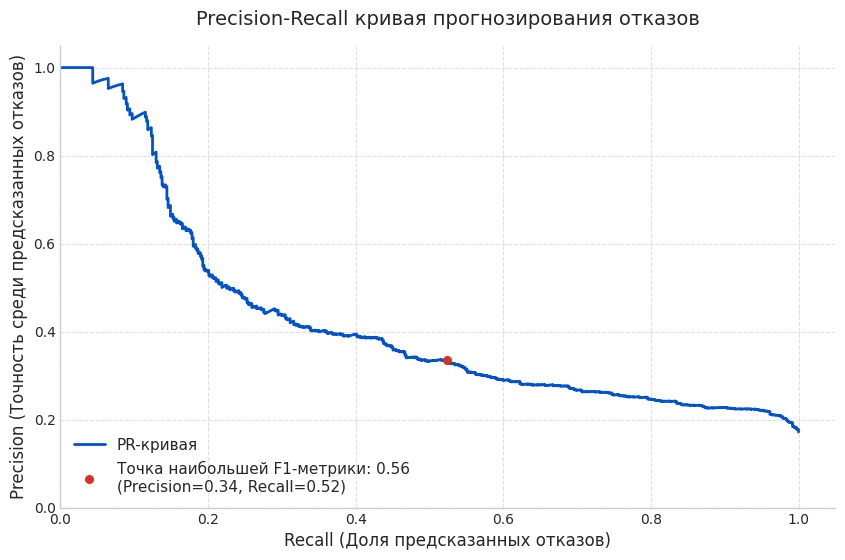

In [ ]:
# Извлечение вероятностей для класса 0
probs_class_0 = model.predict_proba(x_test)[:, 0]

# Инверсия целевой переменной для фокусировки метрик на отказах
y_test_inverted = (y_test == 0).astype(int)

# Расчет параметров кривой Precision-Recall
precision, recall, thresholds = precision_recall_curve(y_test_inverted, probs_class_0)
ap_score = average_precision_score(y_test_inverted, probs_class_0)

# Поиск оптимального порога для максимизации F1-меры на классе отказов
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-9)
optimal_idx = np.argmax(f1_scores)
optimal_threshold = thresholds[optimal_idx]

# Визуализация результатов
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, label=f'PR-кривая', color='#0052cc', linewidth=2)

plt.scatter(
    recall[optimal_idx],
    precision[optimal_idx],
    color='#d93025',
    s=30,
    zorder=5,
    label=f'Точка наибольшей F1-метрики: {optimal_threshold:.2f}\n(Precision={precision[optimal_idx]:.2f}, Recall={recall[optimal_idx]:.2f})'
)

plt.title('Precision-Recall кривая прогнозирования отказов', fontsize=14, pad=15)
plt.xlabel('Recall (Доля предсказанных отказов)', fontsize=12)
plt.ylabel('Precision (Точность среди предсказанных отказов)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(loc='lower left', fontsize=11)
plt.xlim([0.0, 1.05])
plt.ylim([0.0, 1.05])

# Удаление лишних рамок графика для чистоты визуализации
import matplotlib.ticker as ticker
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()


### 5 Финансовый анализ потерь
Выполнил: Алина Мясникова

#### Предобработка адресов

In [ ]:
import re
def extract_city_smart(address):
    # Если данных нет, возвращаем заглушку
    if pd.isna(address) or str(address).strip() == '':
        return 'Неизвестно'

    address = str(address).lower()

    # 1. Проверяем города федерального значения и столицы регионов
    # (Их очень часто пишут вообще без приставок "г.", поэтому их лучше отловить сразу)
    major_cities = [
        'москва', 'санкт-петербург', 'спб', 'севастополь', 'краснодар',
        'воронеж', 'ростов-на-дону', 'екатеринбург', 'казань', 'новосибирск',
        'луганск', 'донецк', 'симферополь', 'сочи'
    ]
    for city in major_cities:
        if city in address:
            return 'Санкт-Петербург' if city == 'спб' else city.title()

    # 2. Разбиваем адрес на логические блоки (обычно они разделены запятыми)
    parts = [p.strip() for p in re.split(r'[,;]', address)]

    # 3. Маркеры типов населенных пунктов
    # Ищем: г. | город | пгт | п. | пос. | с. | село | д. | дер. | ст-ца | х. | аул
    pattern = re.compile(r'\b(г\.|г\s|город\s|гор\.|пгт\.|пгт\s|п\.|п\s|пос\.|поселок\s|с\.|с\s|село\s|д\.|д\s|дер\.|деревня\s|ст-ца\s|станица\s|х\.|х\s|хутор\s|аул\s)(.*)')

    for part in parts:
        match = pattern.search(part)
        if match:
            # Берем всё, что идет ПОСЛЕ маркера в этом блоке
            city_name = match.group(2).strip()

            # Иногда адреса пишут сплошным текстом: "г Москва ул Ленина 1"
            # Чтобы не захватить улицу, отсекаем всё, что начинается с маркеров улиц/домов
            city_name = re.split(r'\b(ул\.|улица|д\.|дом|пер\.|переулок|пр-кт|проспект|ш\.|шоссе|кв\.|мкр|р-н)\b', city_name)[0].strip()

            # Убираем лишние знаки препинания и цифры с краев названия
            city_name = re.sub(r'^[^а-яёa-z]+|[^а-яёa-z]+$', '', city_name, flags=re.IGNORECASE)

            # Исключаем случайный мусор (названия короче 3 букв, кроме Уфы и т.д.)
            if len(city_name) >= 3:
                return city_name.title()

    return 'Прочие'

# Применяем новую функцию к датафрейму
df_fin['contact_Город_чистый'] = df_fin['contact_Город'].apply(extract_city_smart)

In [ ]:
def final_polish(city_name):
    city_name = str(city_name).lower()

    # 1. Список слов, после которых (и включая их) нужно всё отрезать
    stop_words = [
        r'\bобласть\b', r'\bобл\b', r'\bкрай\b', r'\bрайон\b', r'\bр-н\b',
        r'\bреспублика\b', r'\bресп\b', r'\bул\b', r'\bулица\b', r'\bд\.\b',
        r'\bдом\b', r'\bкв\b', r'\bбульвар\b', r'\bпроезд\b'
    ]

    # Отрезаем всё, что идет после стоп-слов
    for word in stop_words:
        city_name = re.split(word, city_name)[0]

    # 2. Убираем лишние точки, запятые, кавычки и цифры (оставляем только буквы и дефис)
    city_name = re.sub(r'[^а-яёa-z\-]', ' ', city_name)

    # 3. Убираем двойные пробелы и пробелы по краям
    city_name = re.sub(r'\s+', ' ', city_name).strip()

    # 4. Исключения (если осталось что-то слишком короткое или пустое)
    if len(city_name) < 3 and city_name not in ['уфа', 'бор', 'шуя', 'оха', 'чуя', 'дно', 'кез']:
        return 'Прочие'

    return city_name.title()

# Применяем финальную полировку
df_fin['contact_Город_чистый'] = df_fin['contact_Город_чистый'].apply(final_polish)

# Посмотрим, насколько сократился список
clean_count = df_fin['contact_Город_чистый'].nunique()

In [ ]:
def remove_region_tails(city_name):
    # Словарь регионов-хвостов, которые часто пишут без слова "область/край/республика"
    regions = {
        'московская', 'московсая', 'мо', 'ростовская', 'тульская', 'свердловская',
        'алтайский', 'саратовская', 'нижегородская', 'ленинградская', 'амурская',
        'пензенская', 'иркутская', 'тюменская', 'томская', 'саха', 'коми', 'крым',
        'татарстан', 'башкортостан', 'сахалин', 'приморский', 'красноярский',
        'хакасия', 'удмуртия', 'пермский', 'марий', 'элл', 'владимирская',
        'смоленская', 'костромкая', 'костромская', 'омская', 'калининградская',
        'астраханская', 'кемеровская', 'вологодская', 'якутия', 'башкирия'
    }

    words = str(city_name).split()
    if len(words) > 1:
        # Оставляем первое слово в любом случае (это название города)
        # А вот второе и последующие слова проверяем по списку регионов
        cleaned_words = [words[0]] + [w for w in words[1:] if w.lower() not in regions]

        # Дополнительная очистка от мусора типа "Ж Д Станции" или "Г Т"
        result = " ".join(cleaned_words)
        result = result.replace('Ж Д Станции ', '').replace('Г Т ', '')

        return result.strip()

    return city_name

# Применяем зачистку
df_fin['contact_Город_чистый'] = df_fin['contact_Город_чистый'].apply(remove_region_tails)

In [ ]:
# Заменяем "ё" на "е" и убираем пробелы вокруг дефисов
df_fin['contact_Город_чистый'] = df_fin['contact_Город_чистый'].str.replace('ё', 'е').str.replace(r'\s*-\s*', '-', regex=True)

In [ ]:
# Получаем список уникальных городов, переводим в строки и сортируем
all_cities = sorted([str(city) for city in df_fin['contact_Город_чистый'].unique() if str(city) != 'nan'])

print(", ".join(all_cities))

Прочие


Несмотря на то, что остались некорректные города вроде «В Нурлатском Районе Республики», «Высокийул Советская», «Туристический Пансионат Клязьминское Водохранилище». В общем подавляющей большинство городов извлечено корректно и подобные единичные отклонения не исказят статистику для крупных городов.

#### Анализ категорий

Всего заказов: 17,966 шт.
Отмененных заказов: 3,084 шт.
Средний процент выкупа: 82.8%
Недополученная выручка: 35,952,479 Руб
Затраты на логистику: 3,341,758 Руб

 Топ-10 по убыткам: Менеджеры (ID) (От 10 заказов)


,Всего_заказов,Кол_во_отказов,Процент_выкупа_%,Прямой_убыток_логистики_Руб,Упущенная_выручка_Руб
contact_responsible_user_id,,,,,
02,3911,569,85.5,"617,649","5,696,800"
30,2505,450,82.0,"488,673","5,166,569"
06,1782,390,78.1,"434,141","4,928,569"
01,2670,330,87.6,"352,706","3,774,894"
03,1519,286,81.2,"301,349","3,133,843"
07,888,175,80.3,"187,081","2,150,214"
09,764,150,80.4,"161,534","1,822,198"
05,671,137,79.6,"149,064","1,828,145"
04,697,78,88.8,"82,002","673,990"


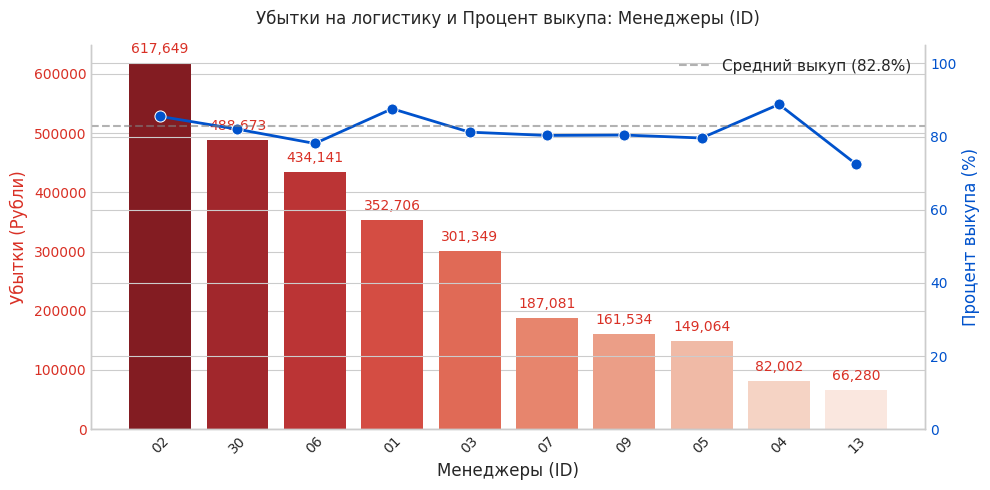



 Топ-10 по убыткам: Города и Регионы (От 10 заказов)


,Всего_заказов,Кол_во_отказов,Процент_выкупа_%,Прямой_убыток_логистики_Руб,Упущенная_выручка_Руб
contact_Город,,,,,
Москва,2125,300,85.9,"321,785","3,555,792"
Санкт-Петербург,701,94,86.6,"100,529","1,021,088"
Екатеринбург,218,38,82.6,"40,828","562,521"
Новосибирск,239,37,84.5,"39,014","422,248"
Хабаровск,121,30,75.2,"32,364","362,618"
Краснодар,176,28,84.1,"30,066","360,111"
Челябинск,152,27,82.2,"29,009","318,442"
Пермь,149,26,82.6,"27,930","275,816"
Самара,162,24,85.2,"26,711","333,400"


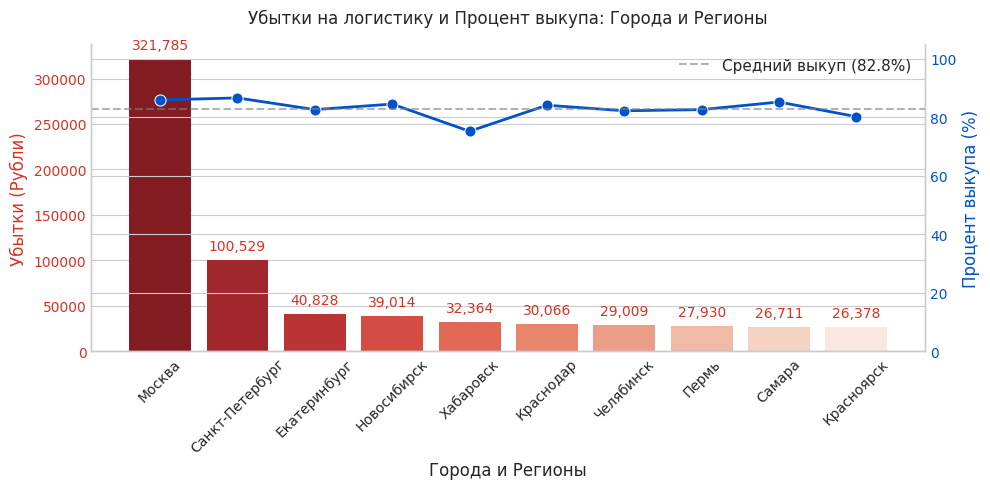



 Топ-10 по убыткам: Службы доставки (От 10 заказов)


,Всего_заказов,Кол_во_отказов,Процент_выкупа_%,Прямой_убыток_логистики_Руб,Упущенная_выручка_Руб
lead_Служба доставки,,,,,
СДЭК до ПВЗ,12588,1925,84.7,"2,068,237","21,852,112"
Почта,2922,687,76.5,"766,537","7,902,308"
СДЭК до Двери,2416,456,81.1,"489,930","6,118,918"
Самовывоз,23,2,91.3,"2,149","19,441"


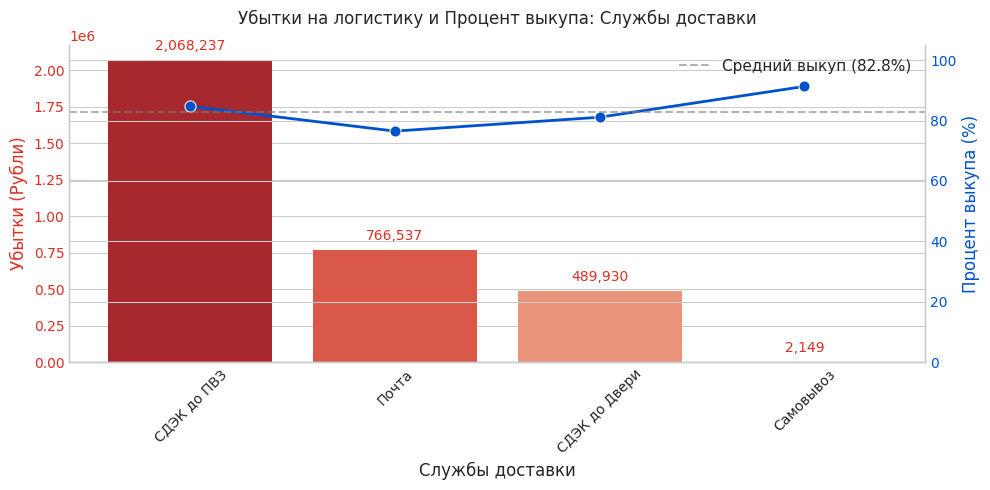



 Топ-10 по убыткам: Тарифы доставки (От 10 заказов)


,Всего_заказов,Кол_во_отказов,Процент_выкупа_%,Прямой_убыток_логистики_Руб,Упущенная_выручка_Руб
lead_Тариф Доставки,,,,,
Посылка склад-склад,12611,2060,83.7,"2,204,374","23,579,676"
Посылка склад-дверь,2303,448,80.5,"479,494","6,113,994"
Почта Посылка,1763,406,77.0,"469,105","4,944,253"
Экономичная посылка склад-склад,121,27,77.7,"29,009","324,807"
Почта Посылка 1 класса,47,12,74.5,"20,776","149,017"
Экономичная посылка склад-дверь,26,8,69.2,"8,595","108,003"


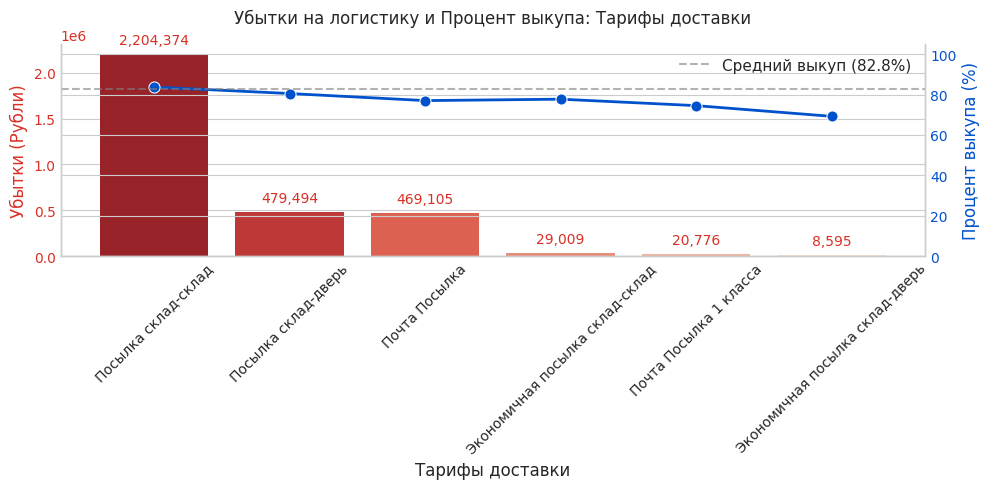

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Функция для анализа категорий по убыткам и проценту выкупа
def analyze_losses_relative(df, column, title, top_n=10, min_orders=10):
    if column not in df.columns:
        return

    df[column] = df[column].fillna('unknown').astype(str)

    # Группируем данные по всем заказам
    grouped = df.groupby(column).agg(
        Всего_заказов=('buyout_flag', 'count'),
        Кол_во_отказов=('buyout_flag', lambda x: (x == 0).sum()),
        Выкупов=('buyout_flag', lambda x: (x == 1).sum()),
        Прямой_убыток_логистики_Руб=('direct_loss', 'sum'),
        Упущенная_выручка_Руб=('lost_revenue', 'sum')
    )

    # Исключаем 'unknown' и 'Не назначен' из данных для графиков
    grouped = grouped.drop(index=['unknown', 'Не назначен', 'nan', 'None'], errors='ignore')

    # Отсекаем категории со слишком малым числом заказов
    grouped = grouped[grouped['Всего_заказов'] >= min_orders].copy()

    # Считаем процент выкупа
    grouped['Процент_выкупа_%'] = (grouped['Выкупов'] / grouped['Всего_заказов'] * 100).round(1)

    # Сортируем по убыткам
    grouped = grouped.sort_values(by='Прямой_убыток_логистики_Руб', ascending=False).head(top_n)

    print(f" Топ-{top_n} по убыткам: {title} (От {min_orders} заказов)")

    # Форматируем для красивого вывода в таблицу
    formatted = grouped.copy()
    formatted['Прямой_убыток_логистики_Руб'] = formatted['Прямой_убыток_логистики_Руб'].apply(lambda x: f"{x:,.0f}")
    formatted['Упущенная_выручка_Руб'] = formatted['Упущенная_выручка_Руб'].apply(lambda x: f"{x:,.0f}")

    cols_order = ['Всего_заказов', 'Кол_во_отказов', 'Процент_выкупа_%', 'Прямой_убыток_логистики_Руб', 'Упущенная_выручка_Руб']
    display(formatted[cols_order])

    # Визуализация (Двойная ось)
    fig, ax1 = plt.subplots(figsize=(10, 5))

    # График 1: Абсолютные убытки (Bars)
    sns.barplot(
        x=grouped.index,
        y='Прямой_убыток_логистики_Руб',
        data=grouped,
        palette='Reds_r',
        ax=ax1
    )
    ax1.set_ylabel('Убытки (Рубли)', color='#d93025', fontsize=12)
    ax1.tick_params(axis='y', labelcolor='#d93025')
    ax1.set_xlabel(title, fontsize=12)
    ax1.tick_params(axis='x', rotation=45)

    # Добавляем текстовые подписи (абсолютные значения) над красными столбцами
    for p in ax1.patches:
        height = p.get_height()
        if height > 0:
            ax1.annotate(f'{height:,.0f}',
                         (p.get_x() + p.get_width() / 2., height),
                         ha='center', va='bottom', fontsize=10, color='#d93025',
                         xytext=(0, 5), textcoords='offset points')

    # График 2: Процент выкупа (Line)
    ax2 = ax1.twinx()
    sns.lineplot(
        x=grouped.index,
        y='Процент_выкупа_%',
        data=grouped,
        color='#0052cc',
        marker='o',
        linewidth=2,
        markersize=8,
        ax=ax2
    )
    ax2.set_ylabel('Процент выкупа (%)', color='#0052cc', fontsize=12)
    ax2.tick_params(axis='y', labelcolor='#0052cc')

    # Расширяем ось Y для линии, чтобы она не сливалась с цифрами столбцов
    y_min, y_max = ax2.get_ylim()
    ax2.set_ylim(min(0, y_min), max(105, y_max + 10))

    # Средний выкуп по компании
    ax2.axhline(overall_buyout_rate, color='gray', linestyle='--', alpha=0.6, label=f'Средний выкуп ({overall_buyout_rate:.1f}%)')
    ax2.legend(loc='upper right', fontsize=11)

    plt.title(f'Убытки на логистику и Процент выкупа: {title}', fontsize=12, pad=15)

    # Убираем верхние рамки
    ax1.spines['top'].set_visible(False)
    ax2.spines['top'].set_visible(False)

    plt.tight_layout()
    plt.show()
    print("\n")


# 1. Загрузка оригинального датасета
df_fin = pd.read_csv('output_2.csv', low_memory=False)

# Оставляем только заказы с известным исходом
df_fin = df_fin[df_fin['buyout_flag'].isin([0, 1])].copy()

# Очистка колонки с менеджерами
if 'contact_responsible_user_id' in df_fin.columns:
    df_fin['contact_responsible_user_id'] = df_fin['contact_responsible_user_id'].astype(str).str.replace('MGR_00', '', regex=False)
    df_fin['contact_responsible_user_id'] = df_fin['contact_responsible_user_id'].replace(['nan', 'None', '', 'unknown'], 'Не назначен')

# 2. Очистка финансовых колонок
for col in ['lead_price', 'lead_Стоимость доставки']:
    if col in df_fin.columns:
        # Убираем текст, пробелы, оставляем цифры и заменяем запятые на точки
        df_fin[col] = df_fin[col].astype(str).str.replace(r'[^\d\.\,]', '', regex=True).str.replace(',', '.')
        # Заменяем пустые строки на NaN и конвертируем в числа
        df_fin[col] = pd.to_numeric(df_fin[col].replace('', np.nan), errors='coerce').fillna(0)

# Решение проблемы отсутствующих столбцов:
# Высчитываем среднюю стоимость доставки (исключая нули)
avg_delivery = df_fin[df_fin['lead_Стоимость доставки'] > 0]['lead_Стоимость доставки'].mean()
if pd.isna(avg_delivery):
    avg_delivery = 350 # На случай, если данных нет вообще

# Присваиваем среднюю стоимость доставки тем заказам, где она не была указана
df_fin['lead_Стоимость доставки'] = df_fin['lead_Стоимость доставки'].replace(0, avg_delivery)

# 3. Расчет общих показателей
df_fin['direct_loss'] = np.where(df_fin['buyout_flag'] == 0, df_fin['lead_Стоимость доставки'], 0)
df_fin['lost_revenue'] = np.where(df_fin['buyout_flag'] == 0, df_fin['lead_price'], 0)

total_orders = len(df_fin)
total_refusals = len(df_fin[df_fin['buyout_flag'] == 0])
overall_buyout_rate = (total_orders - total_refusals) / total_orders * 100 if total_orders > 0 else 0

total_lost_revenue = df_fin['lost_revenue'].sum()
total_direct_loss = df_fin['direct_loss'].sum()

print(f"Всего заказов: {total_orders:,.0f} шт.")
print(f"Отмененных заказов: {total_refusals:,.0f} шт.")
print(f"Средний процент выкупа: {overall_buyout_rate:.1f}%")
print(f"Недополученная выручка: {total_lost_revenue:,.0f} Руб")
print(f"Затраты на логистику: {total_direct_loss:,.0f} Руб\n")


# 4. Анализ категорий по убыткам
analyze_losses_relative(df_fin, 'contact_responsible_user_id', 'Менеджеры (ID)')
analyze_losses_relative(df_fin, 'contact_Город', 'Города и Регионы')
analyze_losses_relative(df_fin, 'lead_Служба доставки', 'Службы доставки')
analyze_losses_relative(df_fin, 'lead_Тариф Доставки', 'Тарифы доставки')

### 6. Формирование отчета и визуализаций


В ходе исследования проведен полный цикл анализа данных о заказах. Основная проблема — высокие издержки на логистику из-за отказов клиентов (наложенный платеж используется в >95% случаев).

**Ключевые показатели (KPI):**
* **Общий объем выборки:** 17 966 заказов.
* **Базовый процент выкупа:** 82,8%.
* **Прямые логистические издержки по отказам:** 7 756 843 руб.
* **Упущенная выручка:** 35 952 479 руб.

**Результаты моделирования:**
Разработанная модель на базе CatBoost позволяет идентифицировать **65% потенциальных отказов**. При наличии системы скоринга компания могла предотвратить до **5,04 млн руб.** прямых убытков.

Анализ показал, что 98% всех потерь генерируется при выборе наложенного платежа. При этом относительный анализ выявил, что менеджеры с самыми высокими суммами убытков работают эффективнее среднего уровня, а основная проблема кроется в «остывании» клиентов.


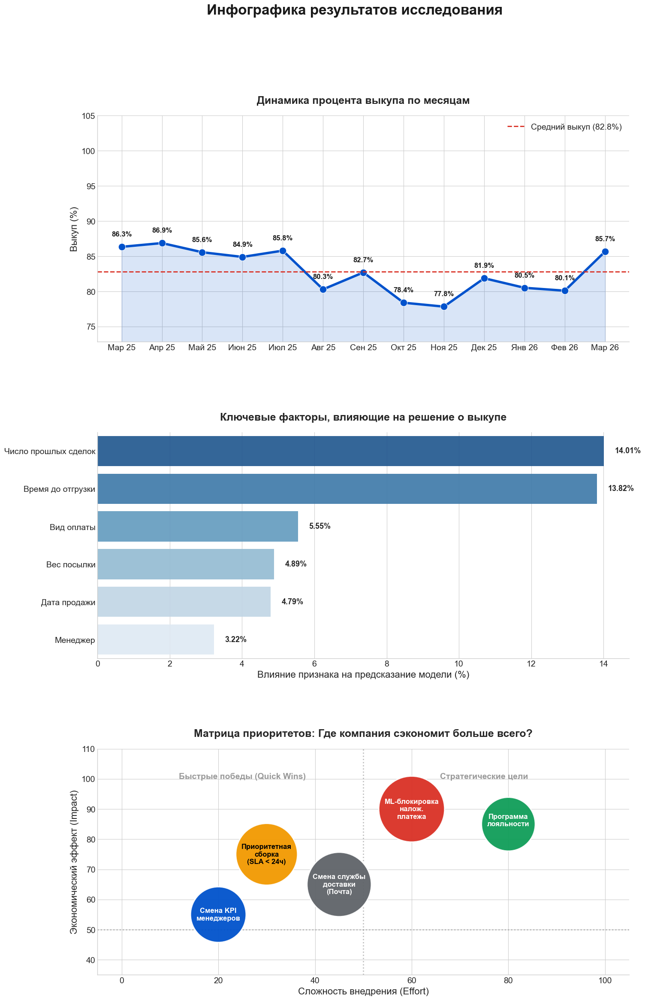

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# 1. Подготовка дат с учетом переходов через год (например, Март 2025 - Март 2026)
if 'sale_ts' in df_fin.columns:
    dt_sale = pd.to_datetime(df_fin['sale_ts'], unit='s', errors='coerce')
    # Создаем формат YYYY-MM для строгой хронологической сортировки
    df_fin['sale_year_month'] = dt_sale.dt.strftime('%Y-%m')

# Словарь для перевода номеров месяцев в русские сокращения
MONTHS_RU_MAP = {
    '01': 'Янв', '02': 'Фев', '03': 'Мар', '04': 'Апр',
    '05': 'Май', '06': 'Июн', '07': 'Июл', '08': 'Авг',
    '09': 'Сен', '10': 'Окт', '11': 'Ноя', '12': 'Дек'
}

# Настройка стиля
plt.style.use('seaborn-v0_8-whitegrid')
fig = plt.figure(figsize=(16, 26))
fig.suptitle('Инфографика результатов исследования',
             fontsize=24, fontweight='bold', y=0.98, color='#1a1a1a')

gs = fig.add_gridspec(3, 1, hspace=0.4)


# График 1. Динамика выкупа
ax1 = fig.add_subplot(gs[0, 0])

# Группируем данные по YYYY-MM
if 'sale_year_month' in df_fin.columns:
    monthly_data = df_fin.groupby('sale_year_month')['buyout_flag'].mean().sort_index() * 100
else:
    monthly_data = pd.Series(dtype=float)

# Формируем красивые подписи (например, из '2025-03' делаем 'Мар 25')
months_labels = [f"{MONTHS_RU_MAP[m.split('-')[1]]} {m.split('-')[0][-2:]}" for m in monthly_data.index]
buyout_values = monthly_data.values.astype(float)

# Создаем числовые индексы для оси X (0, 1, 2...)
x_indexes = np.arange(len(months_labels))

# Рисуем линию
sns.lineplot(x=months_labels, y=buyout_values, ax=ax1, color='#0052cc', marker='o', linewidth=4, markersize=12)
ax1.fill_between(x_indexes, buyout_values, alpha=0.15, color='#0052cc')

# Средний уровень
if len(buyout_values) > 0:
    mean_val = buyout_values.mean()
    ax1.axhline(mean_val, color='#d93025', linestyle='--', linewidth=2, label=f'Средний выкуп ({mean_val:.1f}%)')

ax1.set_title('Динамика процента выкупа по месяцам', fontsize=18, fontweight='bold', pad=20)
ax1.set_ylabel('Выкуп (%)', fontsize=16)
ax1.tick_params(axis='both', labelsize=14)

if len(buyout_values) > 0:
    ax1.set_ylim(min(buyout_values) - 5, 105)
    ax1.legend(loc='upper right', fontsize=14)

for i, val in enumerate(buyout_values):
    ax1.text(i, val + 1.5, f'{val:.1f}%', ha='center', fontweight='bold', color='#1a1a1a', fontsize=12)

# График 2. Значимость факторов (CatBoost)
ax2 = fig.add_subplot(gs[1, 0])

# Обновленные данные из модели CatBoost
importance_data = {
    'Фактор': ['Число прошлых сделок', 'Время до отгрузки', 'Вид оплаты', 'Вес посылки', 'Дата продажи', 'Менеджер'],
    'Значимость': [14.01, 13.82, 5.55, 4.89, 4.79, 3.22]
}
df_imp = pd.DataFrame(importance_data)

sns.barplot(x='Значимость', y='Фактор', data=df_imp, palette='Blues_r', ax=ax2, alpha=0.9)

ax2.set_title('Ключевые факторы, влияющие на решение о выкупе', fontsize=18, fontweight='bold', pad=20)
ax2.set_xlabel('Влияние признака на предсказание модели (%)', fontsize=16)
ax2.set_ylabel('')
ax2.tick_params(axis='both', labelsize=14)

for i, v in enumerate(df_imp['Значимость']):
    ax2.text(v + 0.3, i, f'{v:.2f}%', va='center', fontweight='bold', fontsize=13)


# График 3. Приоритизация гипотез
ax3 = fig.add_subplot(gs[2, 0])

hypotheses = [
    {'name': 'ML-блокировка\nналож.\nплатежа', 'effect': 90, 'effort': 60, 'color': '#d93025', 'text_color': 'white'},
    {'name': 'Приоритетная\nсборка\n(SLA < 24ч)', 'effect': 75, 'effort': 30, 'color': '#f29900', 'text_color': 'black'},
    {'name': 'Программа\nлояльности\n', 'effect': 85, 'effort': 80, 'color': '#0f9d58', 'text_color': 'white'},
    {'name': 'Смена KPI\nменеджеров', 'effect': 55, 'effort': 20, 'color': '#0052cc', 'text_color': 'white'},
    {'name': 'Смена службы\nдоставки\n(Почта)', 'effect': 65, 'effort': 45, 'color': '#5f6368', 'text_color': 'white'}
]
df_h = pd.DataFrame(hypotheses)

ax3.axvline(50, color='gray', linestyle=':', alpha=0.5, linewidth=2)
ax3.axhline(50, color='gray', linestyle=':', alpha=0.5, linewidth=2)

ax3.text(25, 100, 'Быстрые победы (Quick Wins)', ha='center', fontsize=14, color='gray', fontweight='bold', alpha=0.8)
ax3.text(75, 100, 'Стратегические цели', ha='center', fontsize=14, color='gray', fontweight='bold', alpha=0.8)

for i, row in df_h.iterrows():
    ax3.text(row['effort'], row['effect'], row['name'],
             ha='center', va='center', fontsize=12, fontweight='bold', color=row['text_color'],
             bbox=dict(boxstyle="circle,pad=0.8", facecolor=row['color'], edgecolor='white', linewidth=2, alpha=0.95))

ax3.set_title('Матрица приоритетов: Где компания сэкономит больше всего?', fontsize=18, fontweight='bold', pad=20)
ax3.set_xlabel('Сложность внедрения (Effort)', fontsize=16)
ax3.set_ylabel('Экономический эффект (Impact)', fontsize=16)
ax3.tick_params(axis='both', labelsize=14)

ax3.set_xlim(-5, 105)
ax3.set_ylim(35, 110)

# Финальная очистка
for ax in [ax1, ax2, ax3]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout(rect=[0, 0.02, 1, 0.96])
plt.show()

### 7. Генерация гипотез для бизнеса

**Гипотеза 1: Умная блокировка наложенного платежа**
* **Суть:** Поскольку 98% убытков генерирует оплата при получении, предлагается внедрить ML-скоринг в реальном времени.
* **Действие:** Если модель оценивает вероятность отказа выше 70%, опция «Оплата при получении» скрывается, предлагается онлайн-оплата со скидкой.
* **Ожидаемый эффект:** Снижение логистических убытков на 30-40%.

**Гипотеза 2: Скорость сборки и «выгорание» клиента**
* **Суть:** Время передачи в доставку (days_sale_to_handed) - второй по важности признак модели (13.82%).
* **Действие:** Заказы с наложенным платежом должны комплектоваться в приоритетном порядке в течение 12-24 часов.
* **Ожидаемый эффект:** Рост выкупа за счет сокращения времени на изменение решения.

**Гипотеза 3: Ревизия логистических партнеров**
* **Суть:** Служба доставки "Почта" показывает выкуп 76,5%, что на 6,3% ниже среднего.
* **Действие:** Перераспределить объемы в пользу Службы "СДЭК до ПВЗ" (выкуп 84,7%) или провести аудит качества.
* **Ожидаемый эффект:** Снижение издержек в канале.

**Гипотеза 4: Система мотивации персонала**
* **Суть:** Менеджеры под номерами 06 и 13 имеют процент выкупа 78,1% и 72,4% соответственно, тогда как у лидеров, таких как менеджер 01, этот показатель достигает 87,6%.
* **Действие:** Смена KPI. Например привязать бонусы менеджеров не к количеству подтвержденных лидов, а к проценту фактически выкупленных заказов.
*  **Ожидаемый эффект:** Уменьшение числа возвратов.


**Гипотеза 5: Программа лояльности**
* **Суть:** История клиента (contact_Число сделок) выступает самым мощным фактором выкупа, его значимость для предсказания модели составляет 14,01%
* **Действие:** Стимулировать повторные продажи через вложение купонов в первые заказы.
*  **Ожидаемый эффект:** Увеличение числа выкупленных заказов.